# Parametric and Nonparametric Bayesian Propensity Score–Based Doubly Robust (AIPW) Estimation for Causal Inference in Observational Studies.
## Estimating the Effects of Differentiated Minimum Wage Policies and Fiscal Incentives on Informal Employment in Mexico's Northern Border Municipalities.

Autor: Leobardo Enríquez Hernández

**Junio de 2026.**

## Requisitos de software

El notebook está escrito y probado contra las versiones más recientes (junio 2026):

| Paquete | Versión mínima | Notas |
|---|---|---|
| `pymc` | **6.0** | se usa `pm.Data`. `pm.sample` devuelve un `DataTree`. |
| `pymc-bart` | **0.12** | Requiere `numba` y `numpy >= 2.0`. Expone `OneHotSplitRule`, `plot_convergence`, `compute_variable_importance`. |
| `arviz` | **1.1** | API nueva: `az.hdi(x, prob=...)` |
| `numba` | reciente | la que instale `pymc-bart` |
| `statsmodels`, `pandas`, `seaborn`, `geopandas`, `openpyxl` | recientes | sin cambios de API relevantes. |

```bash
pip install -U pymc pymc-bart arviz statsmodels pandas seaborn geopandas openpyxl
```

In [1]:
# ─────────────────────────────────────────────────────────────────────────────
# 1. CONFIGURACIÓN DE REPRODUCIBILIDAD
# ─────────────────────────────────────────────────────────────────────────────
import os

SEED = 3101
os.environ["PYTHONHASHSEED"] = str(SEED)
# Un solo hilo en las BLAS: elimina no-determinismo por orden de reducción en paralelo
for _v in ("MKL_NUM_THREADS", "OPENBLAS_NUM_THREADS", "OMP_NUM_THREADS",
           "NUMEXPR_NUM_THREADS", "VECLIB_MAXIMUM_THREADS"):
    os.environ[_v] = "1"

import random
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from scipy.stats import norm
import statsmodels.api as sm

import arviz as az
import pymc as pm
import pymc_bart as pmb
from numba import njit

%config InlineBackend.figure_format = "retina"
for _st in ("arviz-variat", "arviz-whitegrid", "seaborn-v0_8-whitegrid"):
    if _st in plt.style.available:
        plt.style.use(_st)
        break

# ── Estilo de figuras para la tesis (consistencia y calidad de impresión) ─────
plt.rcParams.update({
    "figure.dpi": 120, "savefig.dpi": 300,
    "savefig.bbox": "tight", "savefig.facecolor": "white", "figure.facecolor": "white",
    "font.size": 12, "axes.titlesize": 14, "axes.labelsize": 12,
    "xtick.labelsize": 11, "ytick.labelsize": 11,
    "axes.spines.top": False, "axes.spines.right": False,
    "legend.frameon": True, "legend.framealpha": 0.95,
})

# ─────────────────────────────────────────────────────────────────────────────
# Exportación de figuras en alta definición → carpeta PSAIPW/
#   - PNG a 300 dpi (calidad de impresión) en PSAIPW/
#   - PDF vectorial (ideal para LaTeX) en PSAIPW/pdf/
# ─────────────────────────────────────────────────────────────────────────────
FIG_DIR = "FigurasPSAIPW"
os.makedirs(FIG_DIR, exist_ok=True)
os.makedirs(os.path.join(FIG_DIR, "pdf"), exist_ok=True)

def save_fig(nombre, fig=None):
    """Guarda la figura activa (o `fig`) como PNG 300 dpi y PDF vectorial."""
    if fig is None:
        fig = plt.gcf()
    fig.savefig(os.path.join(FIG_DIR, f"{nombre}.png"),
                dpi=300, bbox_inches="tight", pad_inches=0.04, facecolor="white")
    fig.savefig(os.path.join(FIG_DIR, "pdf", f"{nombre}.pdf"),
                bbox_inches="tight", pad_inches=0.04, facecolor="white")
    print(f"[guardada] {FIG_DIR}/{nombre}.png  (+ pdf)")

# ── Semilla del RNG interno de numba ─────────────────────────────────────────
# numba mantiene su PROPIO estado aleatorio en código compilado (nopython),
# independiente del estado global de NumPy. La única forma de sembrarlo es
# llamar a np.random.seed DENTRO de una función @njit:
@njit(cache=False)
def _seed_numba(seed):
    np.random.seed(seed)

def fix_all_seeds(seed=SEED):
    """Fija TODAS las fuentes de aleatoriedad relevantes:
       1) NumPy global (lo usa el sampler PGBART de pymc-bart en su parte Python),
       2) random de la stdlib,
       3) el RNG interno de numba (lo usa jitter_duplicated de pymc-bart)."""
    np.random.seed(seed)
    random.seed(seed)
    _seed_numba(seed)

fix_all_seeds(SEED)

# ── Verificación de versiones mínimas ────────────────────────────────────────
from importlib.metadata import version
_req = {"pymc": "6.0", "pymc-bart": "0.12", "arviz": "1.1"}
for _pkg, _min in _req.items():
    _v = version(_pkg)
    print(f"{_pkg:>10}: {_v}")
    assert tuple(map(int, _v.split('.')[:2])) >= tuple(map(int, _min.split('.'))), \
        f"{_pkg} >= {_min} es requerido (instalado: {_v})"
print(f"{'numpy':>10}: {np.__version__}")


      pymc: 6.0.1
 pymc-bart: 0.12.0
     arviz: 1.1.0
     numpy: 2.4.6


## Datos

La muestra incluye 281 municipios de los seis estados mexicanos fronterizos con Estados Unidos, 43 de los cuales pertenecen a la Zona Libre de Frontera Norte (ZLFN). Dado que todos los municipios de Baja California están incluidos en la ZLFN, los cinco municipios de Baja California Sur se agrupan con los de Baja California en una sola unidad analítica. Nuevo León, con 51 municipios, es el único estado donde solo un municipio forma parte de la ZLFN.

In [2]:
dat = pd.read_excel('dataset.xlsx')
dat["state"]     = dat["state"].astype("category")
dat["pib_class"] = dat["pib_class"].astype("category")
dat["urban"]     = dat["urban"].astype("category")
dat.head()


,LLAVE,municipality_name,state,urban,maquila,informal_class,poverty_class,pib_class,pibpc_class,share_manuf_class,informal,imssissste,poverty,lpopulation,urbanpop,lpib,lpibpc,share_manufacture,trt,outcome
0,2001,Baja California Ensenada,2,1,1,2,2,5,5,4,44.941117,80.477908,27.900848,13.252382,89.753307,25.137456,12.142288,30.413544,1,-6.050756
1,2002,Baja California Mexicali,2,1,1,1,2,5,5,4,38.635661,83.170333,22.949496,13.830386,92.300043,26.241905,12.297599,36.977853,1,-3.421040
2,2003,Baja California Tecate,2,1,1,1,2,5,5,5,41.702882,82.648756,23.872581,11.616114,82.855594,24.059878,12.473903,54.628673,1,-2.901544
3,2004,Baja California Tijuana,2,1,1,1,2,5,5,5,36.177469,85.861896,26.588062,14.342304,99.644967,26.803545,12.283074,50.296458,1,0.566683
4,2005,Baja California Playas de Rosarito,2,1,1,2,3,5,5,5,56.410941,75.087620,34.528759,11.614561,90.029092,24.014745,12.271645,42.574534,1,-11.938737


### Matrices de diseño y diccionarios de etiquetas

**Nota de especificación.** 

* **Logit bayesiano** ($\eta_i = X_i^\top\beta$, consistente con la Sec. 3.1.2): se conservan los seis dummies de entidad (que actúan como interceptos por entidad) y se **omite `pib_class_1`** como categoría de referencia.
* **BART**: los árboles no requieren la restricción; se usan todas las dummies con `OneHotSplitRule`.
* **Regresiones OLS del *outcome*** ($\hat m_0,\hat m_1$, Sec. 3.1.3): intercepto explícito + una referencia por bloque (`state_2`, `pib_class_1`).


In [3]:
# ─────────────────────────────────────────────────────────────────────────────
# Dummies y tabla de trabajo
# ─────────────────────────────────────────────────────────────────────────────
d1 = pd.get_dummies(dat["state"],     prefix="state",     dtype=int)
d2 = pd.get_dummies(dat["pib_class"], prefix="pib_class", dtype=int)

selected_columns = dat[["LLAVE", "urban", "maquila", "informal",
                        "imssissste", "lpibpc", "poverty", "share_manufacture",
                        "lpopulation", "trt", "outcome"]]
data = pd.concat([selected_columns, d1, d2], axis=1)

# ─────────────────────────────────────────────────────────────────────────────
# Diccionarios de etiquetas (usados por TODAS las gráficas)
# ─────────────────────────────────────────────────────────────────────────────
STATE_LABELS = {
    "state_2":  "Baja California",   # incluye BCS (unidad analítica conjunta)
    "state_5":  "Coahuila",
    "state_8":  "Chihuahua",
    "state_19": "Nuevo León",
    "state_26": "Sonora",
    "state_28": "Tamaulipas",
}
PIB_LABELS = {f"pib_class_{k}": f"PIB Q{k}" for k in range(1, 6)}

COVARIATE_LABELS = {
    "informal":          "Informalidad inicial (%)",
    "imssissste":        "Acceso IMSS/ISSSTE (%)",
    "lpibpc":            "log PIB per cápita",
    "poverty":           "Pobreza (%)",
    "share_manufacture": "Part. manufactura (%)",
    "lpopulation":       "log población",
    "urban":             "Urbano (>50% pob. urbana)",
    "maquila":           "Presencia de maquila",
    **STATE_LABELS, **PIB_LABELS,
}

# ─────────────────────────────────────────────────────────────────────────────
# Listas de covariables
# ─────────────────────────────────────────────────────────────────────────────
COVS_ALL = ["state_2", "state_5", "state_8", "state_19", "state_26", "state_28",
            "pib_class_1", "pib_class_2", "pib_class_3", "pib_class_4", "pib_class_5",
            "urban", "maquila", "informal", "imssissste", "lpibpc", "poverty",
            "share_manufacture", "lpopulation"]
CONT_COLS = ["informal", "imssissste", "lpibpc", "poverty",
             "share_manufacture", "lpopulation"]

treatment, outcome = "trt", "outcome"
data.head()


,LLAVE,urban,maquila,informal,imssissste,lpibpc,poverty,share_manufacture,lpopulation,trt,...,state_5,state_8,state_19,state_26,state_28,pib_class_1,pib_class_2,pib_class_3,pib_class_4,pib_class_5
0,2001,1,1,44.941117,80.477908,12.142288,27.900848,30.413544,13.252382,1,...,0,0,0,0,0,0,0,0,0,1
1,2002,1,1,38.635661,83.170333,12.297599,22.949496,36.977853,13.830386,1,...,0,0,0,0,0,0,0,0,0,1
2,2003,1,1,41.702882,82.648756,12.473903,23.872581,54.628673,11.616114,1,...,0,0,0,0,0,0,0,0,0,1
3,2004,1,1,36.177469,85.861896,12.283074,26.588062,50.296458,14.342304,1,...,0,0,0,0,0,0,0,0,0,1
4,2005,1,1,56.410941,75.087620,12.271645,34.528759,42.574534,11.614561,1,...,0,0,0,0,0,0,0,0,0,1


## Análisis descriptivo

### Distribuciones y diferencia cruda entre tratados y no tratados

[guardada] FigurasPSAIPW/01_densidad_outcome_completa.png  (+ pdf)


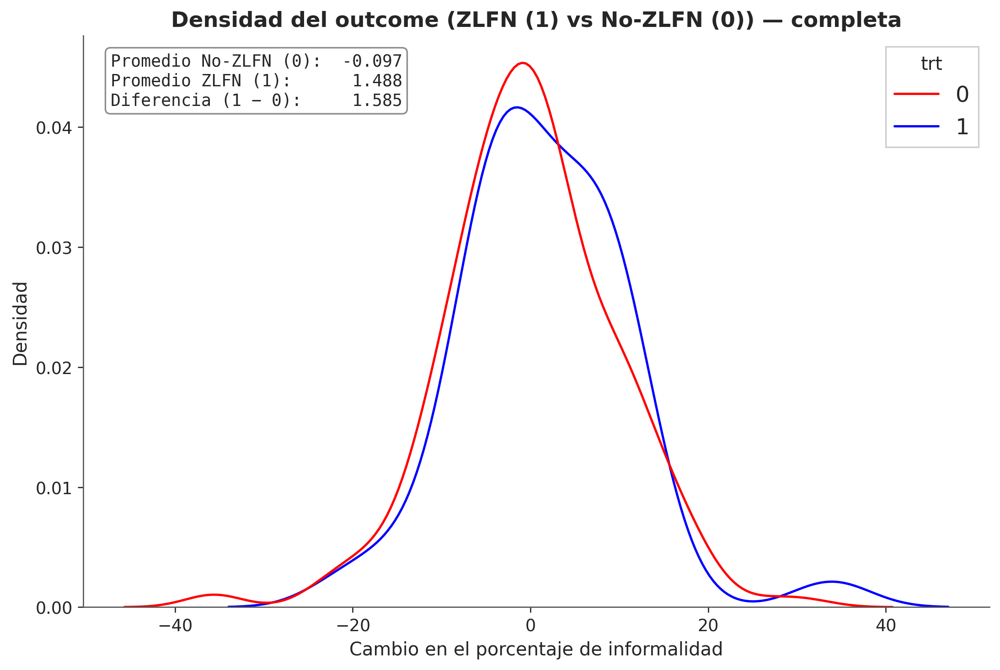

RawDiff (completa): 1.5853225659929968


,outcome
trt,
0,-0.096905
1,1.488417


In [4]:
# ─────────────────────────────────────────────────────────────────────────────
# Funciones descriptivas reutilizables (muestra completa y recortada)
# ─────────────────────────────────────────────────────────────────────────────
def plot_densidad_outcome(df, sufijo):
    fig, ax = plt.subplots(figsize=(9, 6))
    sns.kdeplot(data=df, x=outcome, hue=treatment, common_norm=False,
                palette={0: "red", 1: "blue"}, hue_order=[0, 1], ax=ax)
    ax.set_title(f'Densidad del outcome (ZLFN (1) vs No-ZLFN (0)) — {sufijo}')
    ax.set_xlabel('Cambio en el porcentaje de informalidad')
    ax.set_ylabel('Densidad')

    # ── Caja con promedios por grupo y diferencia ───────────────────────────
    medias = df.groupby("trt")["outcome"].mean()
    m0, m1 = float(medias.loc[0]), float(medias.loc[1])
    raw_diff_val = m1 - m0
    texto = (f"Promedio No-ZLFN (0): {m0:7.3f}\n"
             f"Promedio ZLFN (1):    {m1:7.3f}\n"
             f"Diferencia (1 − 0):   {raw_diff_val:7.3f}")
    ax.text(0.03, 0.97, texto, transform=ax.transAxes, fontsize=11,
            va="top", ha="left", family="monospace",
            bbox=dict(boxstyle="round", facecolor="white",
                      edgecolor="gray", alpha=0.9))

    save_fig(f"01_densidad_outcome_{sufijo}")
    plt.show()
    raw_diff = df.groupby("trt")[["outcome"]].mean()
    print(f"RawDiff ({sufijo}):", raw_diff_val)
    return raw_diff

raw_diff = plot_densidad_outcome(data, "completa")
raw_diff

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1387657694.py:24: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/02_panel_descriptivo_completa.png  (+ pdf)


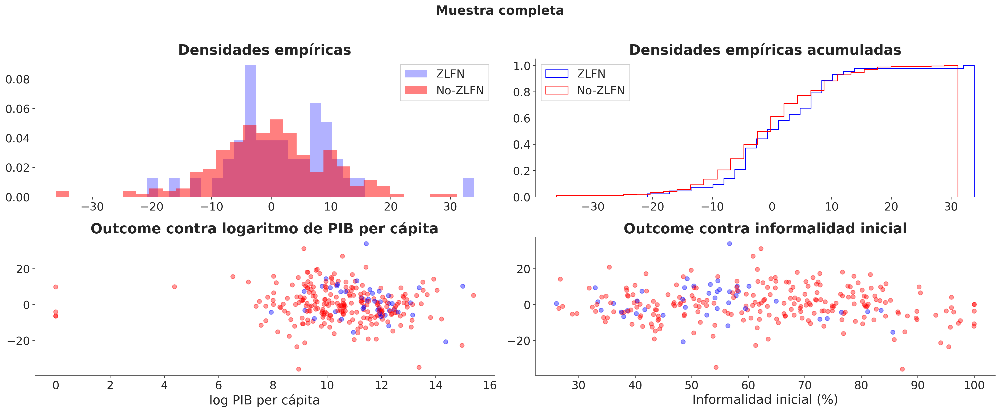

In [5]:
def plot_panel_descriptivo(df, sufijo):
    plt.rcParams.update({"axes.titlesize": 20, "axes.labelsize": 18,
        "xtick.labelsize": 16, "ytick.labelsize": 16, "legend.fontsize": 16})
    fig, axs = plt.subplots(2, 2, figsize=(20, 8))
    axs = axs.flatten()
    axs[0].hist(df[df["trt"] == 1]["outcome"], alpha=0.3, density=True,
                bins=30, label="ZLFN", ec="black", color="blue")
    axs[0].hist(df[df["trt"] == 0]["outcome"], alpha=0.5, density=True,
                bins=30, label="No-ZLFN", ec="black", color="red")
    axs[1].hist(df[df["trt"] == 1]["outcome"], density=True, bins=30,
                cumulative=True, histtype="step", label="ZLFN", color="blue")
    axs[1].hist(df[df["trt"] == 0]["outcome"], density=True, bins=30,
                cumulative=True, histtype="step", label="No-ZLFN", color="red")
    lkup = {1: "blue", 0: "red"}
    axs[2].scatter(df["lpibpc"], df["outcome"], c=df["trt"].map(lkup), alpha=0.4)
    axs[2].set_xlabel(COVARIATE_LABELS["lpibpc"])
    axs[3].scatter(df["informal"], df["outcome"], c=df["trt"].map(lkup), alpha=0.4)
    axs[3].set_xlabel(COVARIATE_LABELS["informal"])
    axs[0].set_title("Densidades empíricas"); axs[0].legend()
    axs[1].set_title("Densidades empíricas acumuladas"); axs[1].legend()
    axs[2].set_title("Outcome contra logaritmo de PIB per cápita")
    axs[3].set_title("Outcome contra informalidad inicial")
    plt.suptitle(f"Muestra {sufijo}", fontsize=18, y=1.02)
    plt.tight_layout()
    save_fig(f"02_panel_descriptivo_{sufijo}", fig)

plot_panel_descriptivo(data, "completa")


[guardada] FigurasPSAIPW/03_cuantiles_outcome_completa.png  (+ pdf)


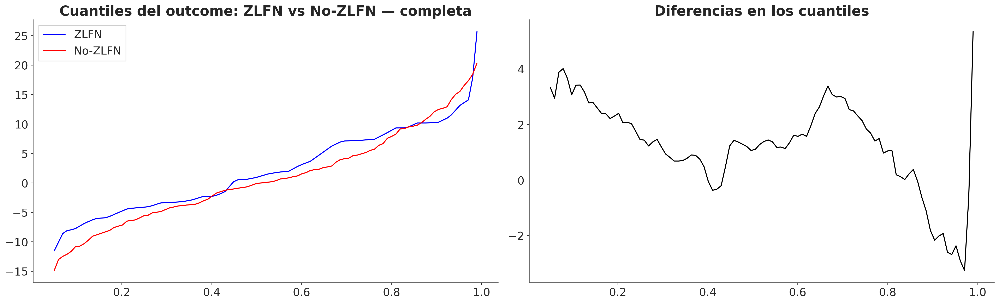

In [6]:
def plot_cuantiles(df, sufijo):
    qs_grid = np.linspace(0.05, 0.99, 100)
    quantile_diff = (
        df.groupby("trt")[["outcome"]]
        .quantile(qs_grid)
        .reset_index()
        .pivot(index="level_1", columns="trt", values="outcome")
        .rename({0: "No-ZLFN", 1: "ZLFN"}, axis=1)
        .assign(diff=lambda x: x["ZLFN"] - x["No-ZLFN"])
        .reset_index()
        .rename({"level_1": "quantile"}, axis=1)
    )
    fig, axs = plt.subplots(1, 2, figsize=(20, 6))
    axs[0].plot(quantile_diff["quantile"], quantile_diff["ZLFN"],    color="blue", label="ZLFN")
    axs[0].plot(quantile_diff["quantile"], quantile_diff["No-ZLFN"], color="red",  label="No-ZLFN")
    axs[0].set_title(f"Cuantiles del outcome: ZLFN vs No-ZLFN — {sufijo}"); axs[0].legend()
    axs[1].plot(quantile_diff["quantile"], quantile_diff["diff"], color="black")
    axs[1].set_title("Diferencias en los cuantiles")
    save_fig(f"03_cuantiles_outcome_{sufijo}", fig)

plot_cuantiles(data, "completa")


## Diferencias ajustadas por estratos definidos por covariables

Las funciones siguientes generalizan cinco criterios de estratificación: entidad federativa, el quintil de PIB, la condición urbana, etc.


In [7]:
# ─────────────────────────────────────────────────────────────────────────────
# Funciones genéricas de estratificación con etiquetas legibles
# ─────────────────────────────────────────────────────────────────────────────
def stratum_label(row, strata_cols):
    """Construye el nombre legible de un estrato a partir de su fila de dummies."""
    parts = []
    state_cols = [c for c in strata_cols if c.startswith("state_")]
    pib_cols   = [c for c in strata_cols if c.startswith("pib_class_")]

    if state_cols:
        on = [STATE_LABELS[c] for c in state_cols if int(row[c]) == 1]
        if len(state_cols) > 1:                       # bloque completo de entidades
            parts.append(on[0] if on else "Otra entidad")
        else:                                          # un solo dummy de entidad
            c = state_cols[0]
            parts.append(STATE_LABELS[c] if int(row[c]) == 1 else "No " + STATE_LABELS[c])

    if pib_cols:
        on = [PIB_LABELS[c] for c in pib_cols if int(row[c]) == 1]
        if len(pib_cols) > 1:                          # bloque completo de quintiles
            parts.append(on[0] if on else "PIB sin clase")
        else:
            c = pib_cols[0]
            parts.append(PIB_LABELS[c] if int(row[c]) == 1 else "No " + PIB_LABELS[c])

    if "urban" in strata_cols:
        parts.append("Urbano" if int(row["urban"]) == 1 else "Rural")
    if "maquila" in strata_cols:
        parts.append("Maquila" if int(row["maquila"]) == 1 else "Sin maquila")
    return " · ".join(parts)


def make_strata_table(data, strata_cols):
    """Tabla de medias del outcome por (trt × estrato) y diferencia vs media global."""
    g = (data.groupby(["trt"] + strata_cols, observed=True)[["outcome"]]
             .agg(["count", "mean"]))
    global_avg = data["outcome"].mean()
    g["global_avg"] = global_avg
    g["diff"] = g[("outcome", "mean")] - global_avg
    g = g.reset_index()
    g.columns = [" ".join(map(str, c)).strip() for c in g.columns.values]
    return g


def adj_raw_diff(strata_df, tag=""):
    """Diferencia de medias de estrato entre grupos (promedio simple de estratos)."""
    g = strata_df.groupby("trt")["outcome mean"].mean()
    val = g.loc[1] - g.loc[0]
    print(f"AdjRawDiff {tag}: {val:.4f}")
    return val


def make_strata_plot(strata_df, strata_cols, titulo="", save_name=None):
    """Dumbbell plot control vs tratamiento por estrato, con NOMBRES en el eje y.
    Versión compacta: ~0.42 in por estrato (antes 1.2), marcadores y fuentes
    reducidos para que los criterios con muchos estratos no salgan tan altos."""
    j = strata_df[strata_df["trt"] == 0].merge(
        strata_df[strata_df["trt"] == 1], on=strata_cols, suffixes=("_c", "_t"))
    j = j.sort_values("diff_t").reset_index(drop=True)
    labels = [stratum_label(r, strata_cols) for _, r in j.iterrows()]

    alto = max(3.2, 0.42 * len(j) + 1.4)
    fig, ax = plt.subplots(figsize=(12, alto))
    for i, (dc, dt) in enumerate(zip(j["diff_c"], j["diff_t"])):
        ax.plot([dc, dt], [i, i], "k--", lw=0.8, zorder=1)
    ax.scatter(j["diff_c"], range(len(j)), s=np.clip(j["outcome count_c"] * 5, 18, 280),
               color="red",  alpha=0.85, zorder=2, label="Control (tamaño ∝ n)")
    ax.scatter(j["diff_t"], range(len(j)), s=np.clip(j["outcome count_t"] * 5, 18, 280),
               color="blue", alpha=0.85, zorder=2, label="Tratamiento (tamaño ∝ n)")
    ax.set_yticks(range(len(j)))
    ax.set_yticklabels(labels, fontsize=10.5)
    ax.set_ylim(-0.7, len(j) - 0.3)
    ax.margins(y=0.01)
    ax.axvline(0, color="k", linestyle="--", lw=1)
    ax.set_xlabel("Diferencia respecto a la media global del outcome", fontsize=12)
    ax.set_ylabel("Estrato", fontsize=12)
    ax.set_title("Diferencias respecto a la media global por estatus de tratamiento\n"
                 + titulo, fontsize=13.5, fontweight="bold")
    ax.tick_params(axis="x", labelsize=11)
    ax.legend(fontsize=10, loc="best")
    plt.tight_layout()
    if save_name:
        save_fig(save_name, fig)
    return j


AdjRawDiff 1 (entidades): 1.3605


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/04_estratos_entidad_completa.png  (+ pdf)


,trt,state_2,state_5,state_8,state_19,state_26,state_28,outcome count,outcome mean,global_avg,diff
0,0,0,0,0,0,0,1,33,-1.022585,0.145689,-1.168273
1,0,0,0,0,0,1,0,61,4.109449,0.145689,3.963760
2,0,0,0,0,1,0,0,50,-2.884934,0.145689,-3.030622
3,0,0,0,1,0,0,0,59,0.036726,0.145689,-0.108962
4,0,0,1,0,0,0,0,30,-3.062583,0.145689,-3.208272
5,0,1,0,0,0,0,0,5,-1.207442,0.145689,-1.353131
6,1,0,0,0,0,0,1,10,0.784489,0.145689,0.638800
7,1,0,0,0,0,1,0,11,-0.338935,0.145689,-0.484623
8,1,0,0,0,1,0,0,1,-2.307348,0.145689,-2.453037
9,1,0,0,1,0,0,0,8,1.576954,0.145689,1.431265


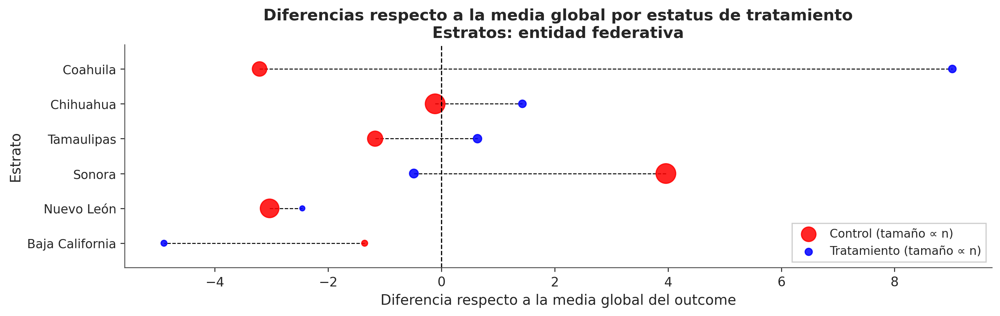

In [8]:
# a) Primer criterio: entidades federativas
cols_a = list(STATE_LABELS)
strata_a = make_strata_table(data, cols_a)
adj_raw_diff(strata_a, "1 (entidades)")
make_strata_plot(strata_a, cols_a, "Estratos: entidad federativa",
                 save_name="04_estratos_entidad_completa");
strata_a.style.background_gradient(axis=0)


AdjRawDiff 2 (quintiles PIB): 2.1633


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/05_estratos_pib_completa.png  (+ pdf)


,trt,pib_class_1,pib_class_2,pib_class_3,pib_class_4,pib_class_5,outcome count,outcome mean,global_avg,diff
0,0,0,0,0,0,1,39,-4.019437,0.145689,-4.165126
1,0,0,0,0,1,0,48,-1.297421,0.145689,-1.443110
2,0,0,0,1,0,0,48,-0.903646,0.145689,-1.049334
3,0,0,1,0,0,0,49,2.288562,0.145689,2.142873
4,0,1,0,0,0,0,54,2.355672,0.145689,2.209983
5,1,0,0,0,0,1,18,-2.497478,0.145689,-2.643166
6,1,0,0,0,1,0,8,3.325526,0.145689,3.179837
7,1,0,0,1,0,0,8,4.264824,0.145689,4.119135
8,1,0,1,0,0,0,7,7.987841,0.145689,7.842152
9,1,1,0,0,0,0,2,-3.840568,0.145689,-3.986257


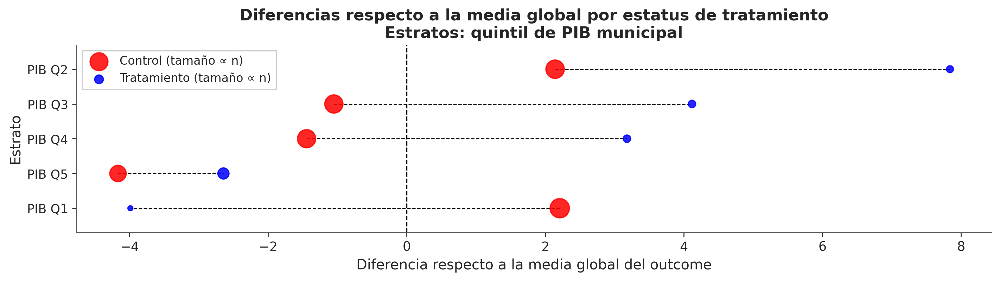

In [9]:
# b) Segundo criterio: quintiles de PIB
cols_b = list(PIB_LABELS)
strata_b = make_strata_table(data, cols_b)
adj_raw_diff(strata_b, "2 (quintiles PIB)")
make_strata_plot(strata_b, cols_b, "Estratos: quintil de PIB municipal",
                 save_name="05_estratos_pib_completa");
strata_b.style.background_gradient(axis=0)


AdjRawDiff 3 (entidad × quintil): 2.5544


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/06_estratos_entidad_x_pib_completa.png  (+ pdf)


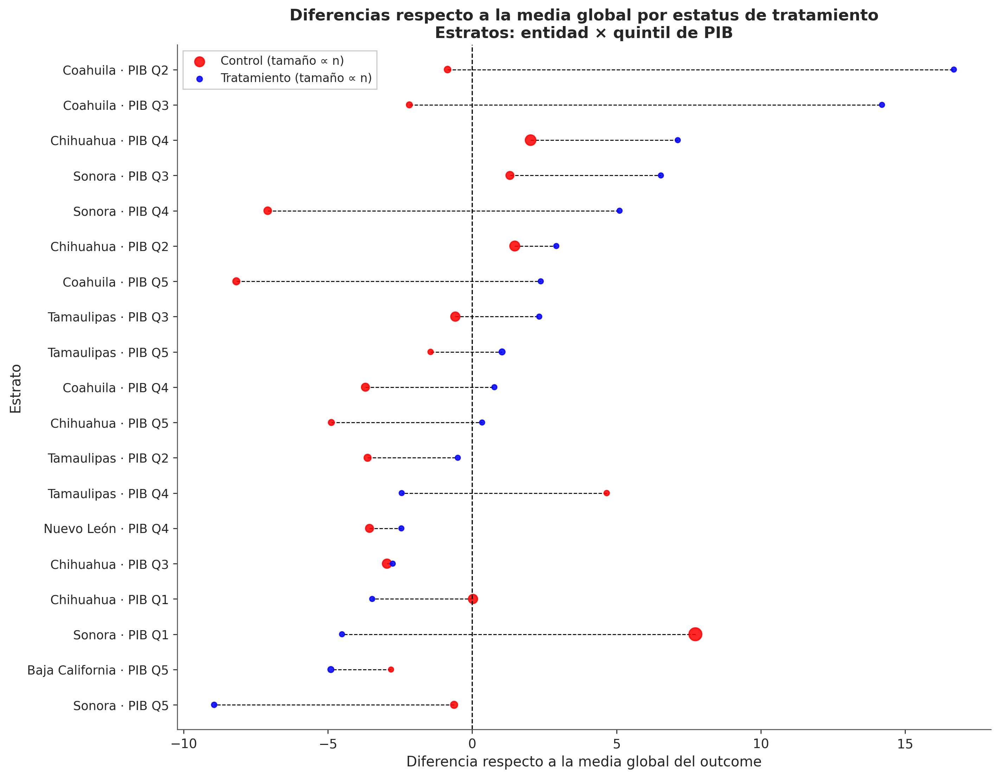

In [10]:
# c) Tercer criterio: entidad × quintil de PIB
cols_c = list(STATE_LABELS) + list(PIB_LABELS)
strata_c = make_strata_table(data, cols_c)
adj_raw_diff(strata_c, "3 (entidad × quintil)")
make_strata_plot(strata_c, cols_c, "Estratos: entidad × quintil de PIB",
                 save_name="06_estratos_entidad_x_pib_completa");


AdjRawDiff 4 (Sonora × urbano × Q5): 0.7652


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/07_estratos_sonora_completa.png  (+ pdf)


,trt,state_26,urban,pib_class_5,outcome count,outcome mean,global_avg,diff
0,0,0,0,0,91,-1.682979,0.145689,-1.828667
1,0,0,1,0,54,0.607474,0.145689,0.461785
2,0,0,1,1,32,-4.793511,0.145689,-4.939199
3,0,1,0,0,37,6.602118,0.145689,6.456429
4,0,1,0,1,1,2.684346,0.145689,2.538658
5,0,1,1,0,17,0.574337,0.145689,0.428648
6,0,1,1,1,6,-1.008341,0.145689,-1.154029
7,1,0,0,0,9,5.444849,0.145689,5.299160
8,1,0,1,0,9,3.167749,0.145689,3.022060
9,1,0,1,1,14,-0.698797,0.145689,-0.844485


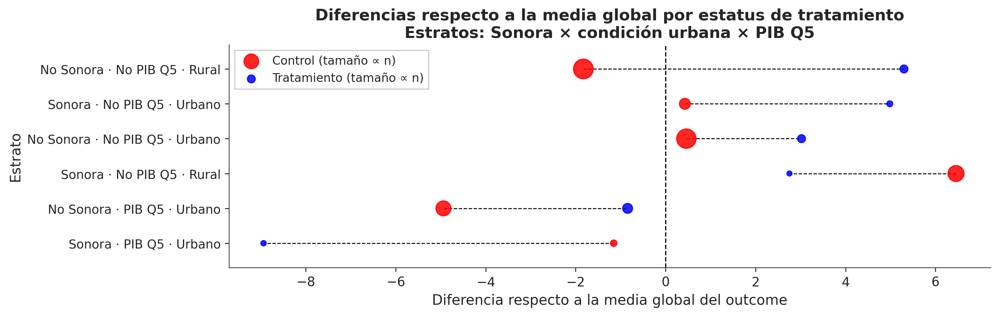

In [11]:
# d) Cuarto criterio: Sonora × urbano × PIB Q5
cols_d = ["state_26", "urban", "pib_class_5"]
strata_d = make_strata_table(data, cols_d)
adj_raw_diff(strata_d, "4 (Sonora × urbano × Q5)")
make_strata_plot(strata_d, cols_d, "Estratos: Sonora × condición urbana × PIB Q5",
                 save_name="07_estratos_sonora_completa");
strata_d.style.background_gradient(axis=0)


AdjRawDiff 5 (Coahuila × urbano × Q5): 6.3170


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/08_estratos_coahuila_completa.png  (+ pdf)


,trt,state_5,urban,pib_class_5,outcome count,outcome mean,global_avg,diff
0,0,0,0,0,119,0.836853,0.145689,0.691165
1,0,0,0,1,1,2.684346,0.145689,2.538658
2,0,0,1,0,57,1.224902,0.145689,1.079214
3,0,0,1,1,31,-3.331460,0.145689,-3.477149
4,0,1,0,0,9,-0.939805,0.145689,-1.085494
5,0,1,1,0,14,-1.946580,0.145689,-2.092269
6,0,1,1,1,7,-8.023874,0.145689,-8.169563
7,1,0,0,0,7,0.483734,0.145689,0.338046
8,1,0,1,0,13,3.062559,0.145689,2.916871
9,1,0,1,1,15,-3.501328,0.145689,-3.647016


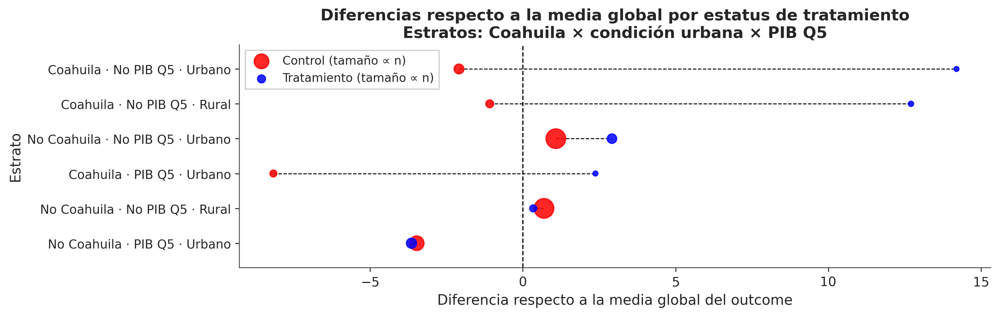

In [12]:
# e) Quinto criterio: Coahuila × urbano × PIB Q5
cols_e = ["state_5", "urban", "pib_class_5"]
strata_e = make_strata_table(data, cols_e)
adj_raw_diff(strata_e, "5 (Coahuila × urbano × Q5)")
make_strata_plot(strata_e, cols_e, "Estratos: Coahuila × condición urbana × PIB Q5",
                 save_name="08_estratos_coahuila_completa");
strata_e.style.background_gradient(axis=0)


## Modelado del *propensity score*

**Notación.** En el texto, $Z_i$ denota la variable de tratamiento; en el código aparece como `t` y `trt`. El *propensity score* $e(X_i)$ aparece como `p` y sus medias posteriores se almacenan como `ps_logit` / `ps_probit`. Es decir, $Z \equiv t \equiv \mathrm{trt}$ y $e(X) \equiv ps$.


In [13]:
# ─────────────────────────────────────────────────────────────────────────────
# Matrices de modelado
# ─────────────────────────────────────────────────────────────────────────────
y = data["outcome"].astype(float)
t = data["trt"].astype(int)
n_obs = len(data)

# Covariables con continuas estandarizadas (media 0, sd 1) — mejora la geometría
# de la posterior en el logit; BART es invariante a transformaciones monótonas.
Xs_all = data[COVS_ALL].astype(float).copy()
for c in CONT_COLS:
    mu_, sd_ = Xs_all[c].mean(), Xs_all[c].std(ddof=0)
    Xs_all[c] = (Xs_all[c] - mu_) / (sd_ + 1e-12)

# Logit bayesiano: referencia pib_class_1 (los 6 dummies de entidad actúan como
# interceptos por entidad; ver nota de especificación).
X_logit = Xs_all.drop(columns=["pib_class_1"])

# BART: todas las columnas; reglas de partición explícitas.
X_bart = Xs_all
DUMMY_COLS  = [c for c in X_bart.columns if c not in CONT_COLS]
SPLIT_RULES = [pmb.OneHotSplitRule if c in DUMMY_COLS else pmb.ContinuousSplitRule
               for c in X_bart.columns]

# Diseño de las regresiones OLS del outcome (plug-in del AIPW):
# intercepto + referencias state_2 y pib_class_1 (sin colinealidad exacta).
OUT_COVS = [c for c in COVS_ALL if c not in ("state_2", "pib_class_1")]
X_out = sm.add_constant(data[OUT_COVS].astype(float))

print(f"n = {n_obs} | tratados = {t.sum()} | X_logit: {X_logit.shape} | "
      f"X_bart: {X_bart.shape} | X_out: {X_out.shape}")


n = 281 | tratados = 43 | X_logit: (281, 18) | X_bart: (281, 19) | X_out: (281, 18)


### Especificación y estimación de los dos modelos de asignación

Conforme a la Sec. 3.1 del texto, se estima $\;Z_i \mid X_i \sim \mathrm{Bernoulli}\big(e(X_i)\big)$ bajo dos parametrizaciones de $e(\cdot)$:

1. **Logit bayesiano (paramétrico):** $e(X_i)=\mathrm{logit}^{-1}(X_i^\top\beta)$ con priors $\beta_j\sim\mathcal N(0,1)$, muestreado con NUTS.
2. **Probit–BART (no paramétrico):** $e(X_i)=\Phi\big(f(X_i)\big)$ con $f$ una suma de $m=50$ árboles regularizados (prior BART), muestreado con PGBART.

Para cada modelo se generan: *prior predictive* (1,000 draws), posterior (4 cadenas × 4,000 draws tras 1,000 de calentamiento, **16,000 draws** en total), log-verosimilitud puntual (para PSIS-LOO) y *posterior predictive*. Todas las llamadas se siembran con `fix_all_seeds` y `cores=1`, conforme al diagnóstico de reproducibilidad.


In [14]:
def make_propensity_model(X, t, bart=True, probit=True, draws=4000, tune=1000,
                          chains=4, m=50, split_rules=None, random_seed=SEED):
    """Construye y estima el modelo bayesiano de asignación del tratamiento.

    Devuelve (modelo, idata) donde idata contiene: prior, prior_predictive,
    posterior, log_likelihood, sample_stats y posterior_predictive.
    """
    coords = {"coeffs": list(X.columns), "obs": np.arange(len(X))}

    with pm.Model(coords=coords) as model_ps:
        if bart:
            # BART necesita la matriz de datos concreta (no un nodo simbólico)
            mu = pmb.BART("mu", X=X.values, Y=t.values.astype(float),
                          m=m, split_rules=split_rules)
            link = pm.math.invprobit if probit else pm.math.invlogit
            p = pm.Deterministic("p", link(mu), dims="obs")
        else:
            X_data = pm.Data("X", X.values, dims=("obs", "coeffs"))
            b = pm.Normal("b", mu=0, sigma=1, dims="coeffs")
            p = pm.Deterministic("p", pm.math.invlogit(pm.math.dot(X_data, b)),
                                 dims="obs")

        pm.Bernoulli("t_pred", p=p, observed=t.values, dims="obs")

        # 1) prior predictive
        fix_all_seeds(random_seed)
        prior = pm.sample_prior_predictive(draws=1000, random_seed=random_seed)

        # 2) posterior (cores=1 OBLIGATORIO para reproducibilidad de PGBART)
        fix_all_seeds(random_seed)
        idata = pm.sample(draws=draws, tune=tune, chains=chains, cores=1,
                          random_seed=random_seed, progressbar=True,
                          idata_kwargs={"log_likelihood": True})

        # 3) posterior predictive
        fix_all_seeds(random_seed)
        pm.sample_posterior_predictive(idata, random_seed=random_seed,
                                       extend_inferencedata=True,
                                       progressbar=False)

    # Anexar los grupos prior al DataTree principal
    for g in prior.children:
        if g not in idata.children:
            idata[g] = prior[g]
    return model_ps, idata


In [15]:
# Modelo 1: logit bayesiano (NUTS)
m_ps_logit, idata_logit = make_propensity_model(
    X_logit, t, bart=False, draws=4000, random_seed=SEED)


Sampling: [b, t_pred]
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [b]


Output()

C:\Users\Leobardo\.conda\envs\zlfn\Lib\site-packages\pymc\sampling\mcmc.py:1163: FutureWarning: Passing `log_likelihood` via `idata_kwargs` is deprecated and will be removed in future versions. Call `pm.compute_log_likelihood(idata)` instead.
  return _sample_return(
Sampling 4 chains for 1_000 tune and 4_000 draw iterations (4_000 + 16_000 draws total) took 25 seconds.
Sampling: [t_pred]


In [16]:
# Modelo 2: probit-BART (PGBART) con reglas de partición explícitas
m_ps_probit, idata_probit = make_propensity_model(
    X_bart, t, bart=True, probit=True, draws=4000, m=50,
    split_rules=SPLIT_RULES, random_seed=SEED)


C:\Users\Leobardo\.conda\envs\zlfn\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:214: UserWarning: Numba will use object mode to run BART_rv{"(m,n),(m),(),(),() -> (m)"}'s perform method. Set `pytensor.config.compiler_verbose = True` to see more details.
  warnings.warn(
Sampling: [mu, t_pred]
Sequential sampling (4 chains in 1 job)
PGBART: [mu]


Output()

C:\Users\Leobardo\.conda\envs\zlfn\Lib\site-packages\pymc\sampling\mcmc.py:1163: FutureWarning: Passing `log_likelihood` via `idata_kwargs` is deprecated and will be removed in future versions. Call `pm.compute_log_likelihood(idata)` instead.
  return _sample_return(
Sampling 4 chains for 1_000 tune and 4_000 draw iterations (4_000 + 16_000 draws total) took 344 seconds.
Sampling: [t_pred]


## Verificación bayesiana formal de los modelos

Siguiendo el flujo de trabajo bayesiano estándar (Gelman et al., 2020; Vehtari et al., 2021), se reportan:

| Prueba | Qué verifica | Herramienta |
|---|---|---|
| R̂ (rank-normalized), ESS bulk/tail, MCSE | Convergencia y resolución Monte Carlo de las cadenas | `az.summary` |
| Divergencias y BFMI | Patologías de la geometría HMC (solo aplica al logit/NUTS) | `sample_stats` |
| *Trace* y *rank plots* | Mezcla y estacionariedad visual | `az.plot_trace`, `az.plot_rank` |
| Convergencia de $f(X)$ y de $e(X)$ en BART | Específico de PGBART | `pmb.plot_convergence` |
| Importancia de variables BART | Plausibilidad del mecanismo de asignación aprendido | `pmb.compute_variable_importance` |
| *Prior predictive check* | Que los priors impliquen proporciones tratadas razonables | manual |
| *Posterior predictive checks* + p-values bayesianos | Ajuste global y por subgrupos (entidad, urbano, PIB) | manual |
| Calibración del PS | Que $\hat e$ aproxime la frecuencia observada de tratamiento | manual |
| PSIS-LOO + Pareto-$k$ | Capacidad predictiva fuera de muestra; comparación logit vs BART | `az.compare` |
| SMD ponderado (*love plot*) | Que ponderar por el PS balancee las covariables | manual |

> Sobre PGBART: al no ser HMC, no produce divergencias ni energía; su convergencia se evalúa con R̂/ESS de $f(X_i)$ y $e(X_i)$ y con `pmb.plot_convergence`.


In [17]:
# ─────────────────────────────────────────────────────────────────────────────
# Tabla de salud MCMC
# ─────────────────────────────────────────────────────────────────────────────
def mcmc_health(idata, var_names, modelo=""):
    s = az.summary(idata, var_names=var_names)
    fila = {
        "Modelo":        modelo,
        "Parámetros":    len(s),
        "R̂ máx":        float(s["r_hat"].astype(float).max()),
        "ESS bulk mín":  float(s["ess_bulk"].astype(float).min()),
        "ESS tail mín":  float(s["ess_tail"].astype(float).min()),
        "MCSE máx":      float(s["mcse_mean"].astype(float).max()),
    }
    try:   # solo NUTS
        fila["Divergencias"] = int(idata.sample_stats["diverging"].sum())
    except Exception:
        fila["Divergencias"] = np.nan
    try:   # solo NUTS
        fila["BFMI mín"] = float(np.min(np.asarray(
            az.bfmi(idata).to_dataset()["energy"])))
    except Exception:
        fila["BFMI mín"] = np.nan
    return fila

salud = pd.DataFrame([
    mcmc_health(idata_logit,  ["b"],  "Logit — coeficientes β"),
    mcmc_health(idata_logit,  ["p"],  "Logit — propensity scores e(X)"),
    mcmc_health(idata_probit, ["mu"], "BART — índice latente f(X)"),
    mcmc_health(idata_probit, ["p"],  "BART — propensity scores e(X)"),
]).set_index("Modelo").round(4)

# Criterios usuales: R̂ < 1.01, ESS > 400, sin divergencias, BFMI > 0.3
salud


,Parámetros,R̂ máx,ESS bulk mín,ESS tail mín,MCSE máx,Divergencias,BFMI mín
Modelo,,,,,,,
Logit — coeficientes β,18,1.00,12713.0,11784.0,0.0056,0.0,1.0181
Logit — propensity scores e(X),281,1.00,17078.0,11992.0,0.0013,0.0,1.0181
BART — índice latente f(X),281,1.01,2084.0,3036.0,0.0110,NaN,NaN
BART — propensity scores e(X),281,1.01,2084.0,3036.0,0.0026,NaN,NaN


In [18]:
# Coeficientes del logit con nombres de covariables
resumen_b = az.summary(idata_logit, var_names=["b"])
resumen_b.index = [COVARIATE_LABELS.get(c, c) for c in X_logit.columns]
resumen_b.round(3)


,mean,sd,eti89_lb,eti89_ub,ess_bulk,ess_tail,r_hat,mcse_mean,mcse_sd
Baja California,-0.024,0.623,-1,0.98,19603,12523,1.00,0.0044,0.0031
Coahuila,-1.006,0.48,-1.8,-0.24,15117,12956,1.00,0.0039,0.0028
Chihuahua,-1.236,0.443,-2,-0.54,13214,12795,1.00,0.0039,0.0027
Nuevo León,-2.467,0.57,-3.4,-1.6,17612,12020,1.00,0.0043,0.0031
Sonora,-1.11,0.447,-1.8,-0.4,13324,13183,1.00,0.0039,0.0027
Tamaulipas,-0.419,0.502,-1.2,0.38,14208,11845,1.00,0.0042,0.0029
PIB Q2,-0.38,0.476,-1.1,0.37,18841,13603,1.00,0.0035,0.0025
PIB Q3,-0.663,0.463,-1.4,0.067,14556,13327,1.00,0.0038,0.0027
PIB Q4,-1.233,0.528,-2.1,-0.39,12713,12473,1.00,0.0047,0.0033
PIB Q5,-1.17,0.639,-2.2,-0.16,12983,12304,1.00,0.0056,0.0039


[guardada] FigurasPSAIPW/d01_trace_logit.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\734065077.py:4: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


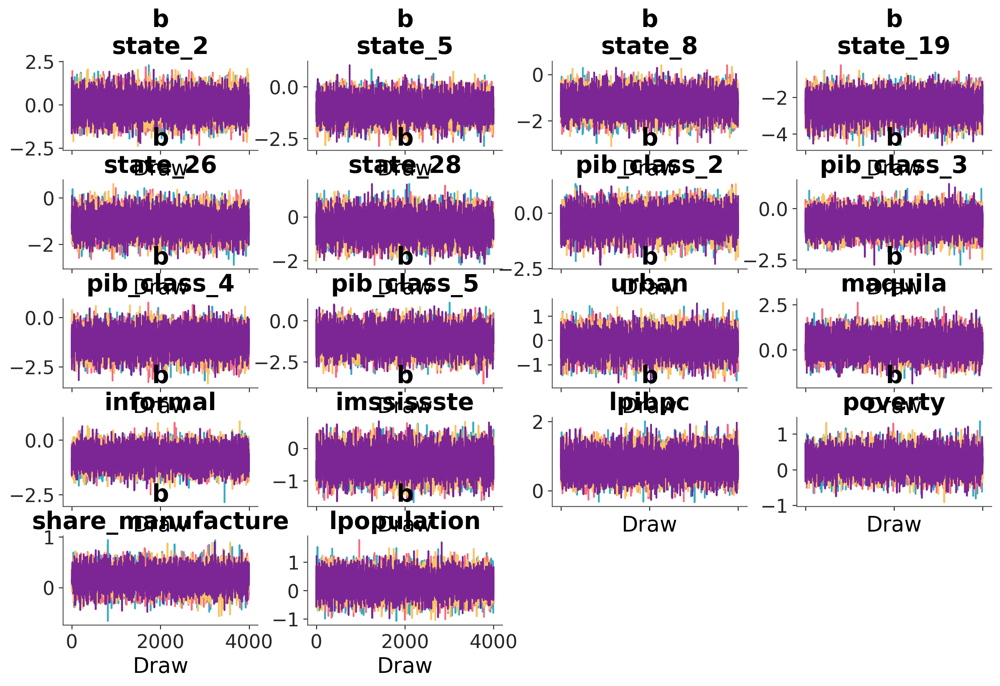

In [19]:
# Trace y rank plots de β (mezcla y estacionariedad)
az.plot_trace(idata_logit, var_names=["b"])
save_fig("d01_trace_logit")
plt.tight_layout()


[guardada] FigurasPSAIPW/d02_rank_logit.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3856212941.py:3: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


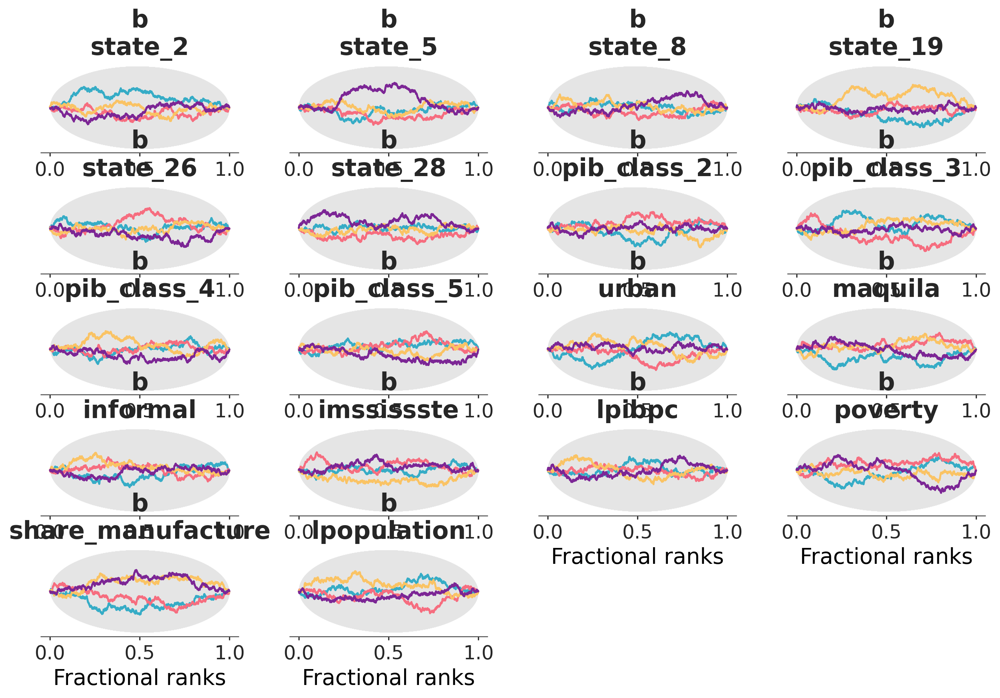

In [20]:
az.plot_rank(idata_logit, var_names=["b"])
save_fig("d02_rank_logit")
plt.tight_layout()


[guardada] FigurasPSAIPW/d03_energia_bfmi_logit.png  (+ pdf)


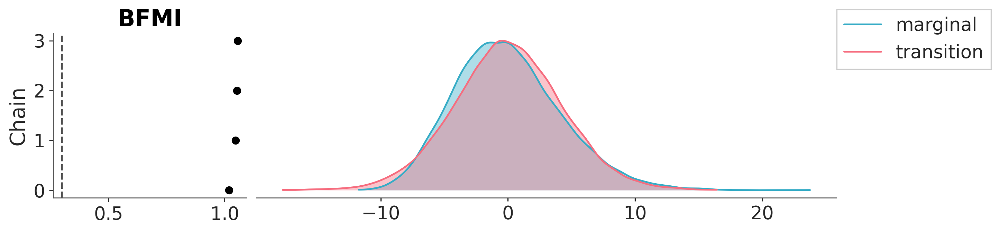

In [21]:
# Energía HMC (solo logit; PGBART no es HMC)
az.plot_energy(idata_logit)
save_fig("d03_energia_bfmi_logit");


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1665800652.py:24: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d04_convergencia_bart.png  (+ pdf)
R̂ máx = 1.0078 | ESS bulk mín = 2085 | ESS tail mín = 3037


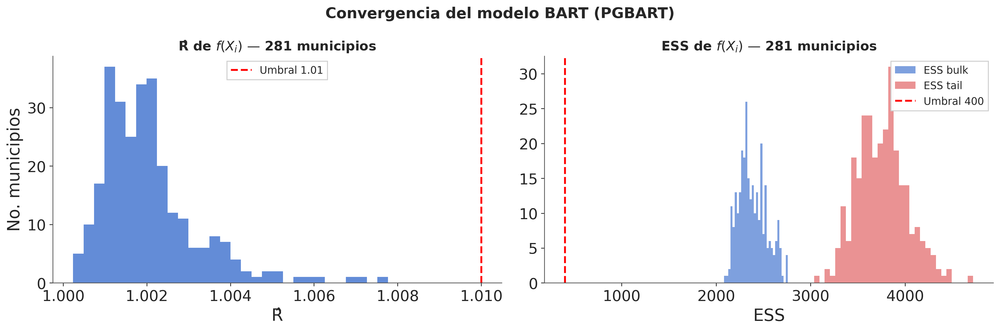

In [22]:
# ─────────────────────────────────────────────────────────────────────────────
# Convergencia del modelo BART: distribución de R̂ y ESS de f(X_i) para los
# 281 municipios.
# ─────────────────────────────────────────────────────────────────────────────
rhat_mu  = az.rhat(idata_probit, var_names=["mu"]).to_dataset()["mu"].values
ess_bulk = az.ess(idata_probit,  var_names=["mu"], method="bulk").to_dataset()["mu"].values
ess_tail = az.ess(idata_probit,  var_names=["mu"], method="tail").to_dataset()["mu"].values

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].hist(rhat_mu, bins=30, color="#4878d0", ec="black", alpha=0.85)
axs[0].axvline(1.01, color="red", ls="--", lw=2, label="Umbral 1.01")
axs[0].set_title("R̂ de $f(X_i)$ — 281 municipios", fontsize=14, fontweight="bold")
axs[0].set_xlabel("R̂"); axs[0].set_ylabel("No. municipios")
axs[0].legend(fontsize=11)

axs[1].hist(ess_bulk, bins=30, color="#4878d0", ec="black", alpha=0.7, label="ESS bulk")
axs[1].hist(ess_tail, bins=30, color="#d62728", ec="black", alpha=0.5, label="ESS tail")
axs[1].axvline(400, color="red", ls="--", lw=2, label="Umbral 400")
axs[1].set_title("ESS de $f(X_i)$ — 281 municipios", fontsize=14, fontweight="bold")
axs[1].set_xlabel("ESS"); axs[1].legend(fontsize=11)

plt.suptitle("Convergencia del modelo BART (PGBART)", fontsize=16, fontweight="bold")
plt.tight_layout()
save_fig("d04_convergencia_bart", fig)

print(f"R̂ máx = {rhat_mu.max():.4f} | ESS bulk mín = {ess_bulk.min():.0f} | "
      f"ESS tail mín = {ess_tail.min():.0f}")


[guardada] FigurasPSAIPW/d04_convergencia_bart_ecdf.png  (+ pdf)


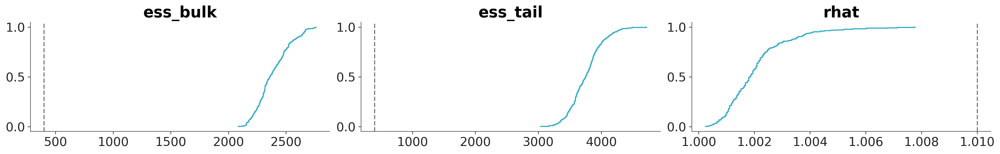

In [23]:
pc = az.plot_convergence_dist(idata_probit, var_names=["mu"])
fig = pc.viz["figure"].item()
save_fig("d04_convergencia_bart_ecdf", fig)

C:\Users\Leobardo\.conda\envs\zlfn\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:214: UserWarning: Numba will use object mode to run BART_rv{"(m,n),(m),(),(),() -> (m)"}'s perform method. Set `pytensor.config.compiler_verbose = True` to see more details.
  warnings.warn(
C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\727061132.py:15: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d05_importancia_variables_bart.png  (+ pdf)


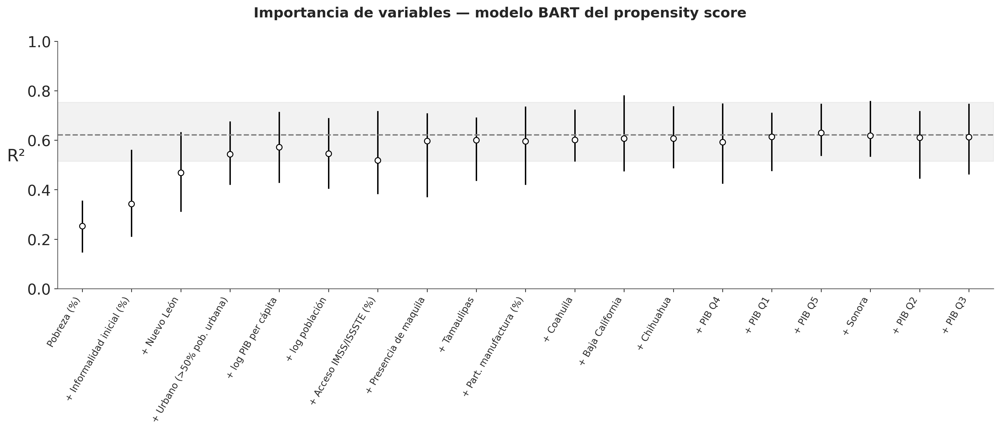

In [24]:
# Importancia de variables en BART: ¿qué covariables gobiernan la asignación?
X_bart_lbl = X_bart.rename(columns=COVARIATE_LABELS)
vi_results = pmb.compute_variable_importance(
    idata_probit, bartrv=m_ps_probit["mu"], X=X_bart_lbl, random_seed=SEED)

ax = pmb.plot_variable_importance(vi_results)
fig = plt.gcf()
fig.set_size_inches(15, 6.5)
for _ax in fig.axes:
    _ax.tick_params(axis="x", rotation=60, labelsize=10)
    for lbl in _ax.get_xticklabels():
        lbl.set_ha("right")
plt.suptitle("Importancia de variables — modelo BART del propensity score",
             fontsize=15)
plt.tight_layout()
save_fig("d05_importancia_variables_bart", fig)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4102040220.py:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d06_prior_predictive.png  (+ pdf)


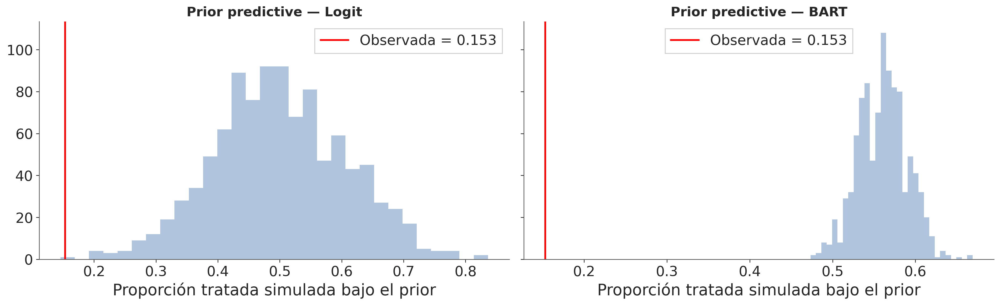

In [25]:
# ─────────────────────────────────────────────────────────────────────────────
# Prior predictive check: proporción tratada implicada por los priors
# Un prior razonable debe cubrir holgadamente la proporción observada (43/281)
# sin concentrarse en los extremos 0 o 1.
# ─────────────────────────────────────────────────────────────────────────────
share_obs = float(t.mean())

fig, axs = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
for ax, idata, nombre in [(axs[0], idata_logit, "Logit"),
                          (axs[1], idata_probit, "BART")]:
    rep = idata.prior_predictive["t_pred"].stack(s=("chain", "draw")).values  # (n, S)
    shares = rep.mean(axis=0)
    ax.hist(shares, bins=30, color="lightsteelblue", ec="black")
    ax.axvline(share_obs, color="red", lw=2,
               label=f"Observada = {share_obs:.3f}")
    ax.set_title(f"Prior predictive — {nombre}", fontsize=15)
    ax.set_xlabel("Proporción tratada simulada bajo el prior")
    ax.legend()
plt.tight_layout()
save_fig("d06_prior_predictive", fig)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_01_ppc_global.png  (+ pdf)


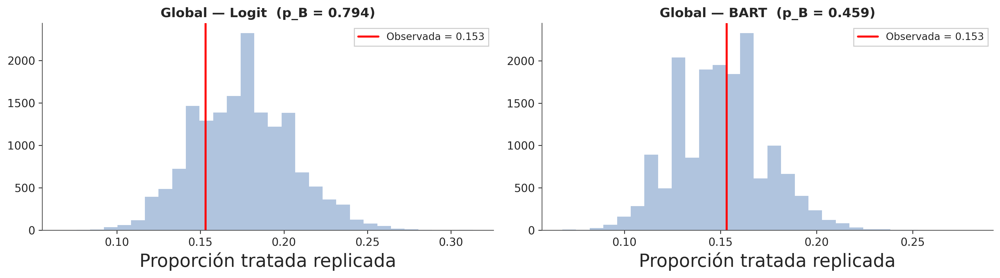

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_02_ppc_baja_california.png  (+ pdf)


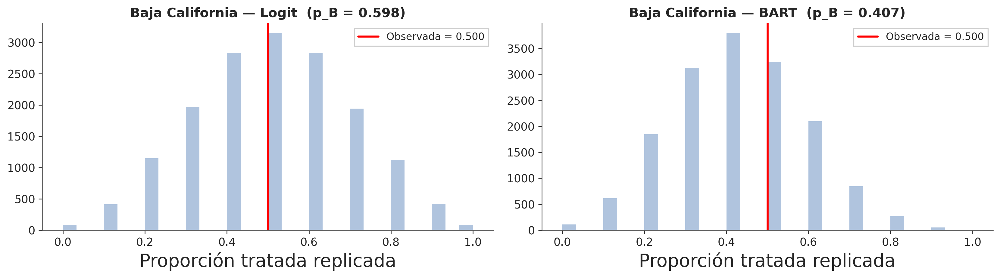

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_03_ppc_coahuila.png  (+ pdf)


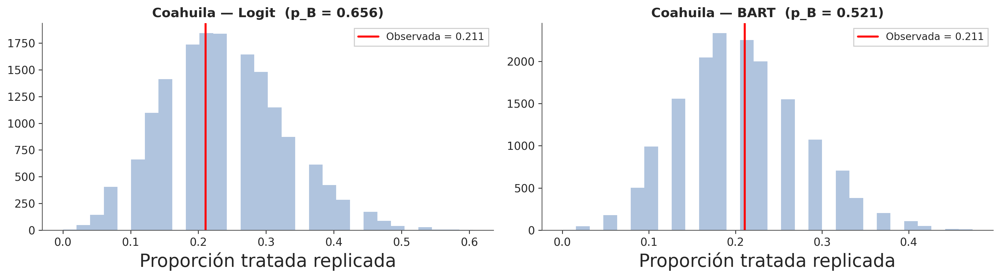

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_04_ppc_chihuahua.png  (+ pdf)


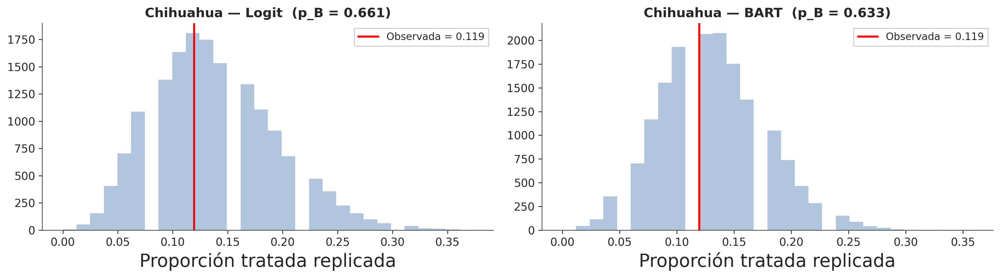

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_05_ppc_nuevo_leon.png  (+ pdf)


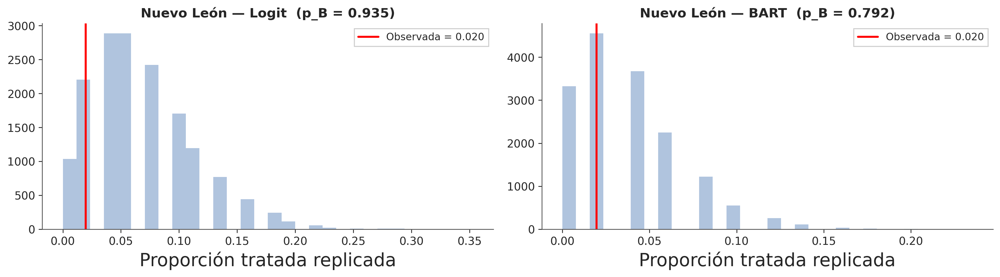

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_06_ppc_sonora.png  (+ pdf)


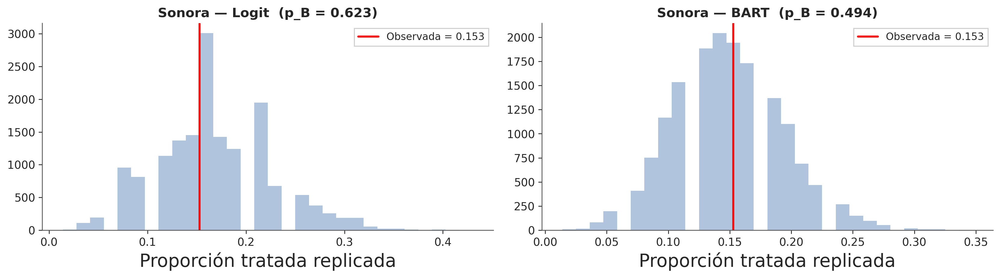

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_07_ppc_tamaulipas.png  (+ pdf)


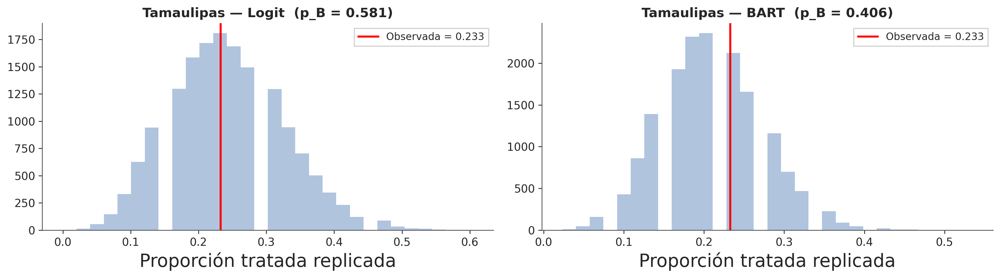

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_08_ppc_urbanos.png  (+ pdf)


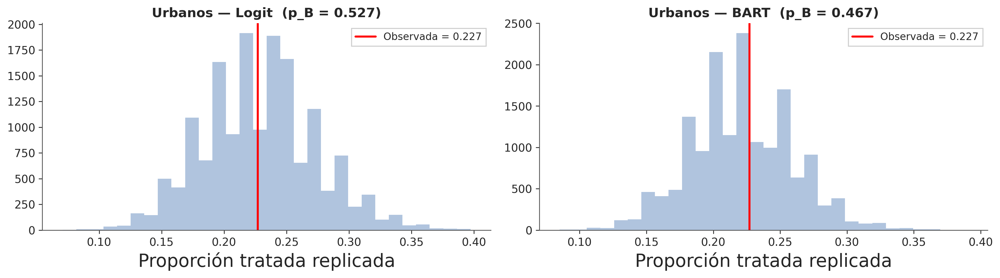

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_09_ppc_pib_q5.png  (+ pdf)


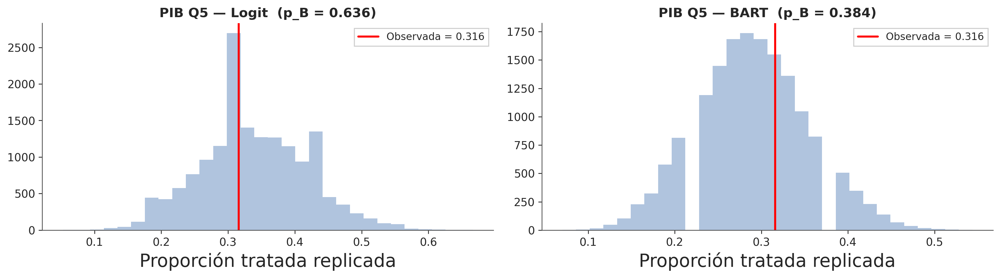

C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\4124029574.py:39: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d07_10_ppc_sonora_urbano.png  (+ pdf)


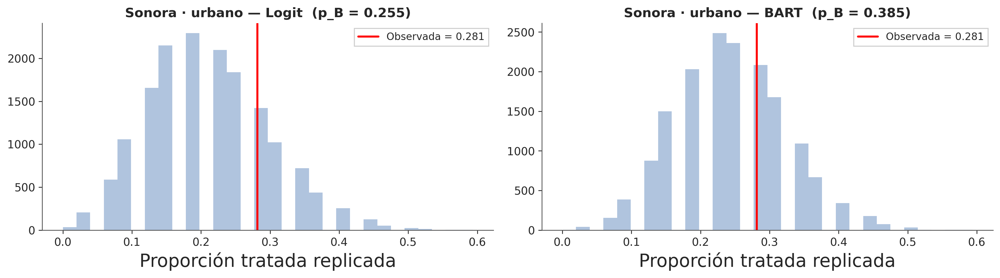

,n,Prop. observada,p_B Logit,p_B BART
Subgrupo,,,,
Global,281,0.153,0.794,0.459
Baja California,10,0.500,0.598,0.407
Coahuila,38,0.211,0.656,0.521
Chihuahua,67,0.119,0.661,0.633
Nuevo León,51,0.020,0.935,0.792
Sonora,72,0.153,0.623,0.494
Tamaulipas,43,0.233,0.580,0.406
Urbanos,141,0.227,0.527,0.467
PIB Q5,57,0.316,0.636,0.384


In [26]:
# ─────────────────────────────────────────────────────────────────────────────
# Posterior predictive checks por subgrupos CON NOMBRES + p-values bayesianos
# Estadístico de prueba: proporción tratada del subgrupo, T(z) = mean(z_i, i∈g).
# p_B = P( T(z_rep) >= T(z_obs) | datos ); valores cercanos a 0 o 1 señalan
# mal ajuste del mecanismo de asignación en ese subgrupo.
# ─────────────────────────────────────────────────────────────────────────────
GRUPOS_PPC = {"Global": np.ones(n_obs, bool)}
for c, nombre in STATE_LABELS.items():
    GRUPOS_PPC[nombre] = (data[c] == 1).values
GRUPOS_PPC["Urbanos"]         = (data["urban"].astype(int) == 1).values
GRUPOS_PPC["PIB Q5"]          = (data["pib_class_5"] == 1).values
GRUPOS_PPC["Sonora · urbano"] = ((data["state_26"] == 1) &
                                 (data["urban"].astype(int) == 1)).values

def ppc_shares(idata, mask):
    """Proporción tratada replicada por draw en el subgrupo `mask`."""
    rep = idata.posterior_predictive["t_pred"].stack(s=("chain", "draw")).values
    return rep[mask].mean(axis=0)          # (S,)

# Una FIGURA INDIVIDUAL por subgrupo (Logit | BART lado a lado), 
# cada una se guarda por separado en FigurasM1/.
filas = []
for k, (nombre, mask) in enumerate(GRUPOS_PPC.items(), start=1):
    obs = float(t.values[mask].mean())
    fila = {"Subgrupo": nombre, "n": int(mask.sum()), "Prop. observada": obs}
    fig, axs = plt.subplots(1, 2, figsize=(14, 4))
    for j, (idata, mod) in enumerate([(idata_logit, "Logit"),
                                      (idata_probit, "BART")]):
        shares = ppc_shares(idata, mask)
        pB = float(np.mean(shares >= obs))
        fila[f"p_B {mod}"] = pB
        axs[j].hist(shares, bins=30, color="lightsteelblue", ec="black")
        axs[j].axvline(obs, color="red", lw=2,
                       label=f"Observada = {obs:.3f}")
        axs[j].set_title(f"{nombre} — {mod}  (p_B = {pB:.3f})", fontsize=13)
        axs[j].set_xlabel("Proporción tratada replicada")
        axs[j].tick_params(labelsize=11)
        axs[j].legend(fontsize=10)
    plt.tight_layout()
    slug = (nombre.lower().replace(" · ", "_").replace(" ", "_")
                  .replace("á","a").replace("é","e").replace("í","i")
                  .replace("ó","o").replace("ú","u").replace("ñ","n"))
    save_fig(f"d07_{k:02d}_ppc_{slug}", fig)
    plt.show()
    filas.append(fila)

tabla_ppc = pd.DataFrame(filas).set_index("Subgrupo").round(3)
tabla_ppc


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\34239470.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/d08_calibracion_ps.png  (+ pdf)


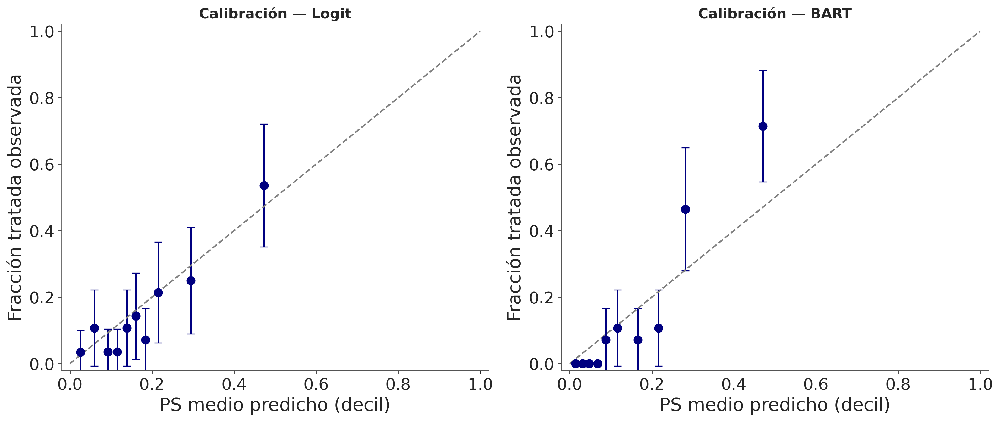

In [27]:
# ─────────────────────────────────────────────────────────────────────────────
# Calibración del propensity score (deciles de e-hat)
# En cada decil, la fracción observada de tratados debe caer dentro de la banda
# binomial alrededor del PS medio predicho.
# ─────────────────────────────────────────────────────────────────────────────
ps_logit  = idata_logit.posterior["p"].mean(dim=("chain", "draw")).values
ps_probit = idata_probit.posterior["p"].mean(dim=("chain", "draw")).values

def plot_calibracion(ps, t, ax, titulo, n_bins=10):
    df = pd.DataFrame({"ps": ps, "t": t.values})
    df["bin"] = pd.qcut(df["ps"], n_bins, duplicates="drop")
    g = df.groupby("bin", observed=True).agg(
        p_pred=("ps", "mean"), p_obs=("t", "mean"), n=("t", "size"))
    se = np.sqrt(g["p_obs"] * (1 - g["p_obs"]) / g["n"])
    ax.errorbar(g["p_pred"], g["p_obs"], yerr=1.96 * se, fmt="o",
                ms=8, capsize=4, color="navy")
    ax.plot([0, 1], [0, 1], "--", color="gray")
    ax.set_xlabel("PS medio predicho (decil)")
    ax.set_ylabel("Fracción tratada observada")
    ax.set_title(titulo, fontsize=14)
    ax.set_xlim(-0.02, 1.02); ax.set_ylim(-0.02, 1.02)

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
plot_calibracion(ps_logit,  t, axs[0], "Calibración — Logit")
plot_calibracion(ps_probit, t, axs[1], "Calibración — BART")
plt.tight_layout()
save_fig("d08_calibracion_ps", fig)


,rank,elpd,p,elpd_diff,weight,se,dse,warning
Probit-BART,0,-90.0,8.7,0.0,1.0,8.4,0.0,False
Logit,1,-110.0,12.9,-26.0,0.0,10.0,3.4,False


[guardada] FigurasPSAIPW/d09_comparacion_loo.png  (+ pdf)

Diagnóstico Pareto-k:

— Logit —
Computed from 16000 posterior samples and 281 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  -114.75    10.29
p_loo       12.89        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      281  100.0%
   (0.70, 1]   (bad)         0    0.0%
    (1, Inf)   (very bad)    0    0.0%


— Probit-BART —
Computed from 16000 posterior samples and 281 observations log-likelihood matrix.

         Estimate       SE
elpd_loo   -89.23     8.45
p_loo        8.71        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      281  100.0%
   (0.70, 1]   (bad)         0    0.0%
    (1, Inf)   (very bad)    0    0.0%



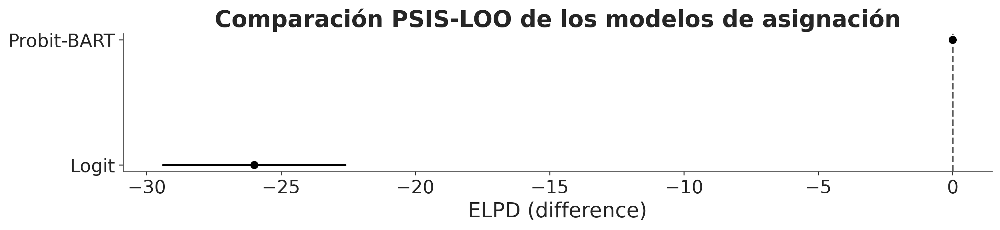

In [28]:
# ─────────────────────────────────────────────────────────────────────────────
# Comparación de modelos: PSIS-LOO (Vehtari, Gelman y Gabry, 2017)
# elpd_loo más alto = mejor capacidad predictiva fuera de muestra del mecanismo
# de asignación. El diagnóstico Pareto-k valida la aproximación; k > 0.7 en
# muchas observaciones invalidaría la comparación.
# ─────────────────────────────────────────────────────────────────────────────
comparacion = az.compare({"Logit": idata_logit, "Probit-BART": idata_probit})
display(comparacion)
az.plot_compare(comparacion)
plt.title("Comparación PSIS-LOO de los modelos de asignación")
save_fig("d09_comparacion_loo")

print("\nDiagnóstico Pareto-k:")
for nombre, idata in [("Logit", idata_logit), ("Probit-BART", idata_probit)]:
    print(f"\n— {nombre} —")
    print(az.loo(idata))


## *Propensity scores* por municipio

Se compara la posterior de $e(X_i)$ bajo ambos modelos para una submuestra de municipios, **identificados por nombre**.


In [29]:
# ─────────────────────────────────────────────────────────────────────────────
# Etiquetas de municipio: usa la columna de nombre si existe; si no, construye
# "Mpio <LLAVE> — <Entidad>" a partir de la clave INEGI.
# ─────────────────────────────────────────────────────────────────────────────
NOMBRES_ESTADOS = {
    "02": "Baja California", "03": "Baja California Sur", "05": "Coahuila",
    "08": "Chihuahua", "19": "Nuevo León", "26": "Sonora", "28": "Tamaulipas",
}

_cands = [c for c in dat.columns
          if c.lower() in ("nom_mun", "mun_name", "municipio", "nombre", "name")]
if _cands:
    MUN_LABELS = dat[_cands[0]].astype(str).values
else:
    _llave = dat["LLAVE"].astype(str).str.zfill(5)
    MUN_LABELS = np.array([
        f"Mpio {k} — {NOMBRES_ESTADOS.get(k[:2], k[:2])}" for k in _llave])

print("Ejemplos de etiquetas:", MUN_LABELS[:3])


Ejemplos de etiquetas: ['Mpio 02001 — Baja California' 'Mpio 02002 — Baja California'
 'Mpio 02003 — Baja California']


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\871055753.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/09_forest_ps_municipios.png  (+ pdf)


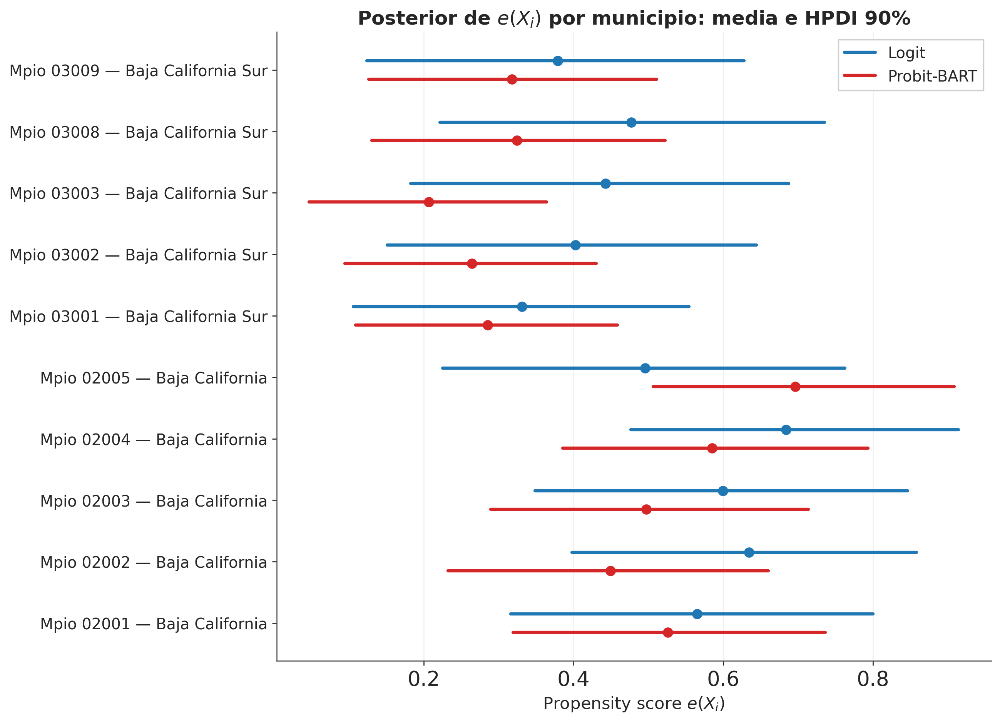

In [30]:
# ─────────────────────────────────────────────────────────────────────────────
# Gráfico de bosque manual: media posterior + HPDI 90% de e(X_i) por modelo,
# para los primeros 10 municipios, con NOMBRE en el eje y.
# ─────────────────────────────────────────────────────────────────────────────
IDX_FOREST = np.arange(10)

fig, ax = plt.subplots(figsize=(11, 8))
colores = {"Logit": "#1f77b4", "Probit-BART": "#d62728"}
offset  = {"Logit": +0.15, "Probit-BART": -0.15}

for nombre, idata in [("Logit", idata_logit), ("Probit-BART", idata_probit)]:
    post = idata.posterior["p"].stack(s=("chain", "draw")).values  # (n, S)
    for j, i in enumerate(IDX_FOREST):
        draws = post[i, :]
        lo, hi = az.hdi(draws, prob=0.90)
        m = draws.mean()
        yj = j + offset[nombre]
        ax.plot([lo, hi], [yj, yj], color=colores[nombre], lw=2.5,
                label=nombre if j == 0 else None)
        ax.plot(m, yj, "o", color=colores[nombre], ms=7)

ax.set_yticks(range(len(IDX_FOREST)))
ax.set_yticklabels([MUN_LABELS[i] for i in IDX_FOREST], fontsize=12)
ax.set_xlabel("Propensity score $e(X_i)$", fontsize=13)
ax.set_title("Posterior de $e(X_i)$ por municipio: media e HPDI 90%",
             fontsize=15, fontweight="bold")
ax.legend(fontsize=12)
ax.grid(axis="x", alpha=0.3)
plt.tight_layout()
save_fig("09_forest_ps_municipios", fig)


## Soporte común: municipios con PS extremo y muestra recortada

Se identifican municipios con $e(X_i)<0.1$ o $e(X_i)>0.9$ bajo cualquiera de los dos modelos (violaciones potenciales de positividad) y se construye la **muestra recortada** con $0.1\le e\le 0.9$ bajo *ambos* modelos simultáneamente. La muestra recortada es el **resultado primario** del análisis y se exporta a `dataset_trimmed.xlsx` (insumo del notebook `BDML.ipynb`).


In [31]:
# ─────────────────────────────────────────────────────────────────────────────
# Municipios extremos (con nombre) y máscara de recorte
# ─────────────────────────────────────────────────────────────────────────────
ps_logit_s  = pd.Series(ps_logit,  index=dat.index)
ps_probit_s = pd.Series(ps_probit, index=dat.index)

def tabla_extremos(ps, etiqueta):
    lo = ps < 0.1
    hi = ps > 0.9
    tab = pd.DataFrame({
        "Municipio": MUN_LABELS[lo.values | hi.values],
        "PS":        ps[lo | hi].round(3).values,
        "Tipo":      np.where(ps[lo | hi] < 0.1, "Bajo (<0.1)", "Alto (>0.9)"),
        "Tratado":   t.values[lo.values | hi.values],
    }).sort_values("PS").reset_index(drop=True)
    print(f"{etiqueta}: {lo.sum()} municipios con PS<0.1, {hi.sum()} con PS>0.9")
    return tab

tab_ext_logit = tabla_extremos(ps_logit_s,  "Logit")
tab_ext_bart  = tabla_extremos(ps_probit_s, "Probit-BART")

display(tab_ext_logit)
display(tab_ext_bart)

trim_mask = ((ps_logit_s  >= 0.1) & (ps_logit_s  <= 0.9) &
             (ps_probit_s >= 0.1) & (ps_probit_s <= 0.9))
trim_original_indices = np.where(trim_mask.values)[0]

print(f"\nMuestra completa : {len(dat)} municipios ({int(t.sum())} tratados)")
print(f"Muestra recortada: {trim_mask.sum()} municipios "
      f"({int(t[trim_mask].sum())} tratados)")


Logit: 78 municipios con PS<0.1, 0 con PS>0.9
Probit-BART: 141 municipios con PS<0.1, 0 con PS>0.9


,Municipio,PS,Tipo,Tratado
0,Mpio 19003 — Nuevo León,0.008,Bajo (<0.1),0
1,Mpio 19035 — Nuevo León,0.009,Bajo (<0.1),0
2,Mpio 19027 — Nuevo León,0.011,Bajo (<0.1),0
3,Mpio 19023 — Nuevo León,0.011,Bajo (<0.1),0
4,Mpio 19015 — Nuevo León,0.014,Bajo (<0.1),0
...,...,...,...,...
73,Mpio 26060 — Sonora,0.095,Bajo (<0.1),1
74,Mpio 05015 — Coahuila,0.096,Bajo (<0.1),0
75,Mpio 08014 — Chihuahua,0.097,Bajo (<0.1),0
76,Mpio 26049 — Sonora,0.097,Bajo (<0.1),0


,Municipio,PS,Tipo,Tratado
0,Mpio 19027 — Nuevo León,0.005,Bajo (<0.1),0
1,Mpio 19040 — Nuevo León,0.005,Bajo (<0.1),0
2,Mpio 19015 — Nuevo León,0.006,Bajo (<0.1),0
3,Mpio 19002 — Nuevo León,0.006,Bajo (<0.1),0
4,Mpio 19035 — Nuevo León,0.007,Bajo (<0.1),0
...,...,...,...,...
136,Mpio 26060 — Sonora,0.096,Bajo (<0.1),1
137,Mpio 05034 — Coahuila,0.097,Bajo (<0.1),0
138,Mpio 08053 — Chihuahua,0.098,Bajo (<0.1),1
139,Mpio 05015 — Coahuila,0.098,Bajo (<0.1),0



Muestra completa : 281 municipios (43 tratados)
Muestra recortada: 133 municipios (38 tratados)


In [32]:
# ─────────────────────────────────────────────────────────────────────────────
# Exportar dataset_trimmed.xlsx (insumo de BDML.ipynb)
# ─────────────────────────────────────────────────────────────────────────────
dat_export = dat.copy()
dat_export["ps_logit"]  = ps_logit
dat_export["ps_probit"] = ps_probit
dat_trimmed_export = dat_export[trim_mask.values].reset_index(drop=True)
dat_trimmed_export.to_excel("dataset_trimmed.xlsx", index=False)
print(f"dataset_trimmed.xlsx exportado: {len(dat_trimmed_export)} municipios")
print(f"Columnas: {list(dat_trimmed_export.columns)}")


dataset_trimmed.xlsx exportado: 133 municipios
Columnas: ['LLAVE', 'municipality_name', 'state', 'urban', 'maquila', 'informal_class', 'poverty_class', 'pib_class', 'pibpc_class', 'share_manuf_class', 'informal', 'imssissste', 'poverty', 'lpopulation', 'urbanpop', 'lpib', 'lpibpc', 'share_manufacture', 'trt', 'outcome', 'ps_logit', 'ps_probit']


## Overlap (positividad)

Histogramas de $e(X_i)$ por grupo y de los **pesos IPW estabilizados** $w_1 = \bar{Z}/\hat e$ (tratados), $w_0=(1-\bar Z)/(1-\hat e)$ (controles). Pesos extremos señalan municipios que dominarían la corrección de aumentación del AIPW.


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1149989518.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/10_overlap_pesos_completa.png  (+ pdf)


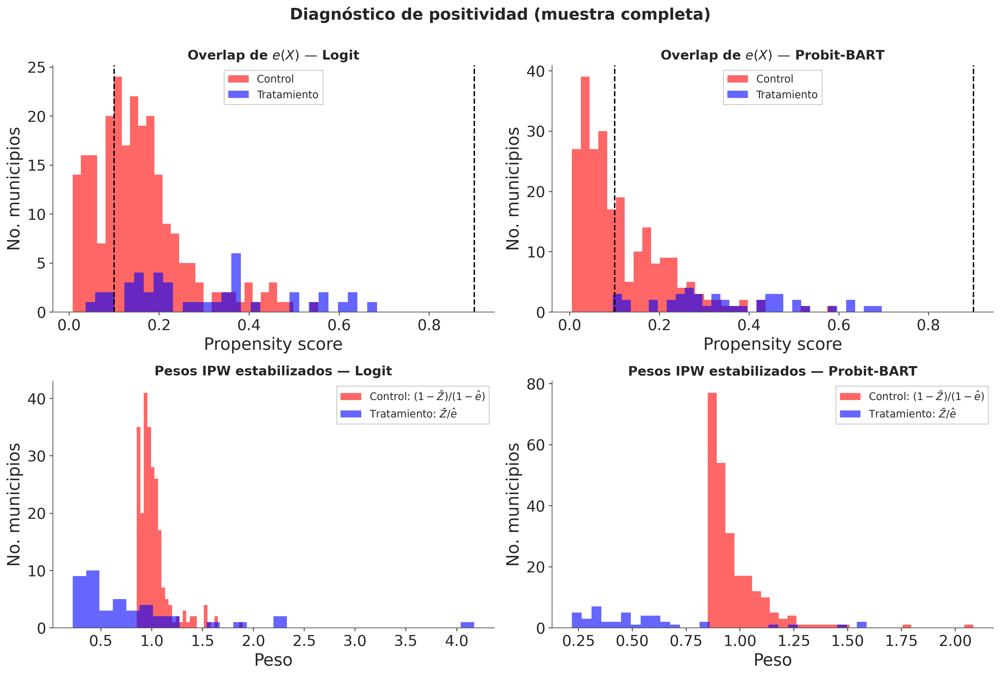

In [33]:
# ─────────────────────────────────────────────────────────────────────────────
# Overlap: PS por grupo y pesos estabilizados
# ─────────────────────────────────────────────────────────────────────────────
pt = t.mean()
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

for ax, ps, nombre in [(axs[0, 0], ps_logit, "Logit"),
                       (axs[0, 1], ps_probit, "Probit-BART")]:
    ax.hist(ps[t == 0], bins=30, color="red",  alpha=0.6, ec="black", label="Control")
    ax.hist(ps[t == 1], bins=30, color="blue", alpha=0.6, ec="black", label="Tratamiento")
    ax.axvline(0.1, ls="--", color="black"); ax.axvline(0.9, ls="--", color="black")
    ax.set_title(f"Overlap de $e(X)$ — {nombre}", fontsize=14)
    ax.set_xlabel("Propensity score"); ax.set_ylabel("No. municipios")
    ax.legend(fontsize=11)

for ax, ps, nombre in [(axs[1, 0], ps_logit, "Logit"),
                       (axs[1, 1], ps_probit, "Probit-BART")]:
    w1 = pt / ps[t == 1]
    w0 = (1 - pt) / (1 - ps[t == 0])
    ax.hist(w0, bins=30, color="red",  alpha=0.6, ec="black", label="Control: $(1-\\bar Z)/(1-\\hat e)$")
    ax.hist(w1, bins=30, color="blue", alpha=0.6, ec="black", label="Tratamiento: $\\bar Z/\\hat e$")
    ax.set_title(f"Pesos IPW estabilizados — {nombre}", fontsize=14)
    ax.set_xlabel("Peso"); ax.set_ylabel("No. municipios")
    ax.legend(fontsize=11)

plt.suptitle("Diagnóstico de positividad (muestra completa)",
             fontsize=17, fontweight="bold", y=1.001)
plt.tight_layout()
save_fig("10_overlap_pesos_completa", fig)


## Balance de covariables

**Love plot.** Diferencia de medias estandarizada (SMD) de cada covariable, cruda y ponderada por IPW estabilizado con cada modelo de PS. Tras el ajuste se espera $|\mathrm{SMD}|<0.1$ (líneas punteadas). Las covariables se etiquetan **por nombre en español**.


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1287238356.py:45: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/11_balance_smd_completa.png  (+ pdf)


,Crudo,IPW Logit,IPW Probit-BART
Informalidad inicial (%),-0.663,-0.102,-0.196
Urbano (>50% pob. urbana),0.611,0.298,0.200
Nuevo León,-0.608,-0.189,-0.449
log PIB per cápita,0.596,0.267,0.301
log población,0.589,0.078,0.122
PIB Q5,0.584,0.007,0.186
Presencia de maquila,0.562,0.053,0.185
PIB Q1,-0.544,-0.262,-0.217
Acceso IMSS/ISSSTE (%),0.498,0.117,0.117
Baja California,0.384,0.043,0.164


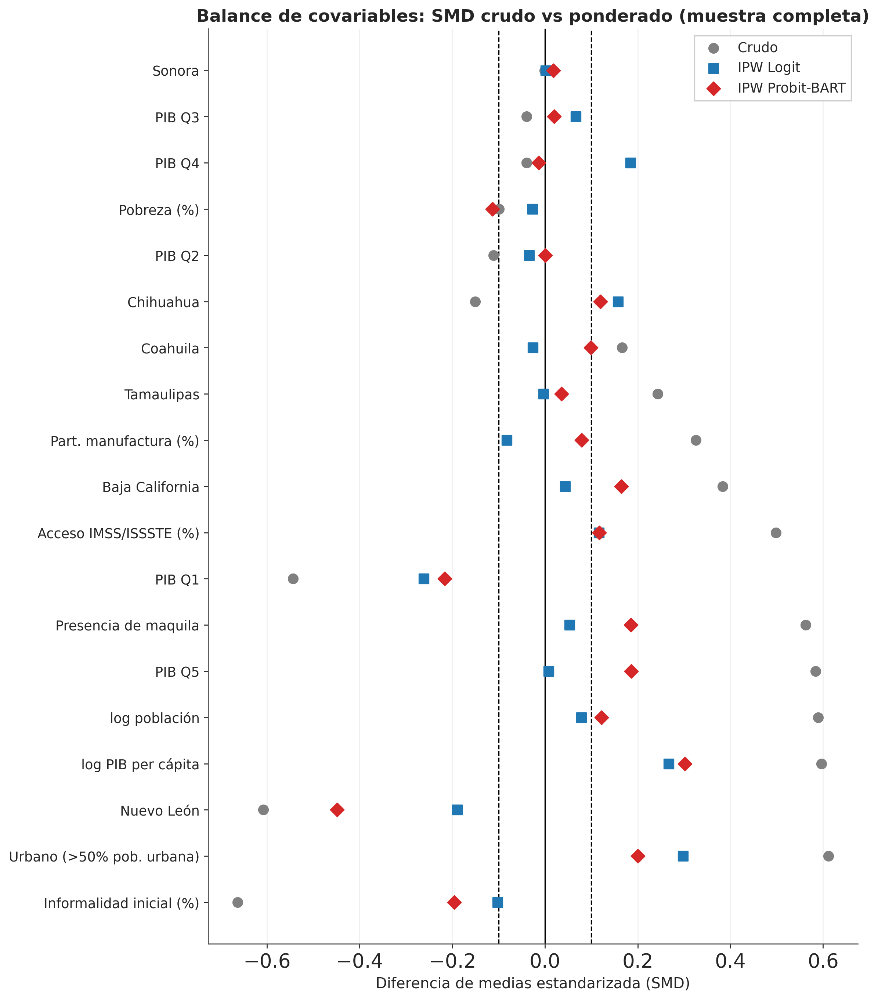

In [34]:
# ─────────────────────────────────────────────────────────────────────────────
# Love plot: SMD crudo vs ponderado (pesos IPW estabilizados)
# ─────────────────────────────────────────────────────────────────────────────
def smd(x, t, w=None):
    x = np.asarray(x, dtype=float); t = np.asarray(t)
    if w is None:
        w = np.ones_like(x)
    w = np.asarray(w, dtype=float)
    def wm(v, ww):  return np.sum(ww * v) / np.sum(ww)
    def wv(v, ww):  m = wm(v, ww); return np.sum(ww * (v - m) ** 2) / np.sum(ww)
    m1, m0 = wm(x[t == 1], w[t == 1]), wm(x[t == 0], w[t == 0])
    s = np.sqrt((wv(x[t == 1], w[t == 1]) + wv(x[t == 0], w[t == 0])) / 2)
    return (m1 - m0) / (s + 1e-12)

def pesos_estabilizados(ps, t):
    pt = t.mean()
    return np.where(t == 1, pt / ps, (1 - pt) / (1 - ps))

def love_plot(X, t, ps_dict, titulo, save_name=None):
    covs = list(X.columns)
    etiquetas = [COVARIATE_LABELS.get(c, c) for c in covs]
    res = pd.DataFrame(index=etiquetas)
    res["Crudo"] = [smd(X[c], t) for c in covs]
    for nombre, ps in ps_dict.items():
        w = pesos_estabilizados(ps, t.values)
        res[f"IPW {nombre}"] = [smd(X[c], t, w) for c in covs]
    res = res.iloc[np.argsort(np.abs(res["Crudo"]))[::-1]]

    fig, ax = plt.subplots(figsize=(10, 0.5 * len(covs) + 2))
    marcadores = {"Crudo": ("o", "gray"), "IPW Logit": ("s", "#1f77b4"),
                  "IPW Probit-BART": ("D", "#d62728")}
    for colu in res.columns:
        mk, col = marcadores.get(colu, ("x", "black"))
        ax.scatter(res[colu], range(len(res)), marker=mk, s=60,
                   color=col, label=colu, zorder=3)
    ax.axvline(0, color="black", lw=1)
    ax.axvline(-0.1, ls="--", color="black", lw=1)
    ax.axvline(0.1,  ls="--", color="black", lw=1)
    ax.set_yticks(range(len(res)))
    ax.set_yticklabels(res.index, fontsize=11)
    ax.set_xlabel("Diferencia de medias estandarizada (SMD)", fontsize=12)
    ax.set_title(titulo, fontsize=14, fontweight="bold")
    ax.legend(fontsize=11)
    ax.grid(axis="x", alpha=0.3)
    plt.tight_layout()
    if save_name:
        save_fig(save_name, fig)
    return res.round(3)

tabla_smd = love_plot(
    Xs_all, t,
    {"Logit": ps_logit, "Probit-BART": ps_probit},
    "Balance de covariables: SMD crudo vs ponderado (muestra completa)",
    save_name="11_balance_smd_completa")
tabla_smd


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3807632284.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/12_balance_quintilPS_informal_completa.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3807632284.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/13_balance_quintilPS_imss_completa.png  (+ pdf)


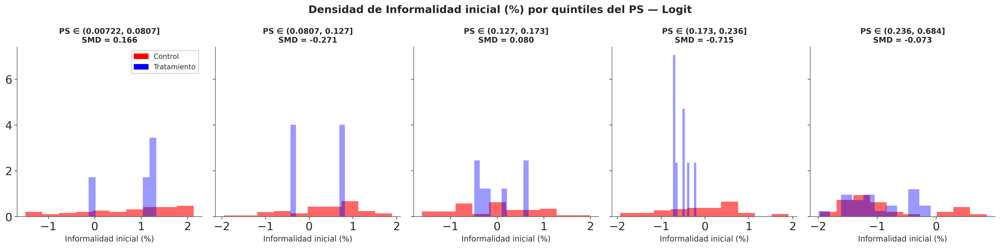

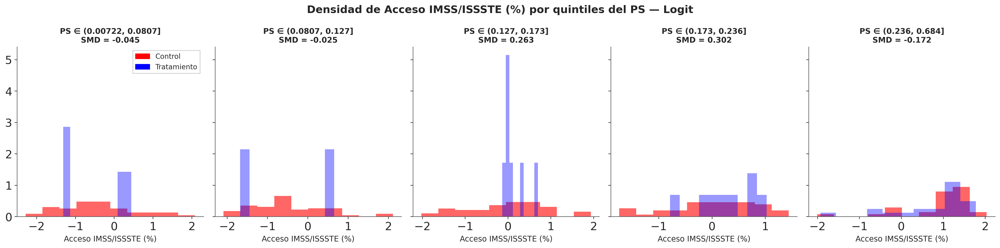

In [35]:
# ─────────────────────────────────────────────────────────────────────────────
# Balance por quintiles del PS (logit): densidades por grupo con SMD por estrato
# ─────────────────────────────────────────────────────────────────────────────
def plot_balance(X, col, t, ps, titulo_modelo, save_name=None):
    temp = X.copy()
    temp["ps_cut"] = pd.qcut(ps, 5, duplicates="drop")
    cortes = temp["ps_cut"].cat.categories
    fig, axs = plt.subplots(1, len(cortes), figsize=(20, 5), sharey=True)
    for c, ax in zip(cortes, np.atleast_1d(axs)):
        sel = temp["ps_cut"] == c
        x0 = temp.loc[sel & (t.values == 0), col]
        x1 = temp.loc[sel & (t.values == 1), col]
        d = smd(temp.loc[sel, col], t.values[sel.values])
        ax.hist(x0, bins=10, alpha=0.6, color="red",  density=True, ec="black")
        ax.hist(x1, bins=10, alpha=0.4, color="blue", density=True, ec="black")
        ax.set_title(f"PS ∈ {c}\nSMD = {d:.3f}", fontsize=11)
        ax.set_xlabel(COVARIATE_LABELS.get(col, col), fontsize=11)
    h = [mpatches.Patch(color="red", label="Control"),
         mpatches.Patch(color="blue", label="Tratamiento")]
    np.atleast_1d(axs)[0].legend(handles=h, fontsize=10)
    plt.suptitle(f"Densidad de {COVARIATE_LABELS.get(col, col)} por quintiles "
                 f"del PS — {titulo_modelo}", fontsize=15, fontweight="bold")
    plt.tight_layout()
    if save_name:
        save_fig(save_name, fig)

plot_balance(Xs_all, "informal",   t, ps_logit, "Logit",
             save_name="12_balance_quintilPS_informal_completa")
plot_balance(Xs_all, "imssissste", t, ps_logit, "Logit",
             save_name="13_balance_quintilPS_imss_completa")


## Mapa de *propensity scores* por municipio

Mapa coroplético de los estados fronterizos (shapefile del Marco Geoestadístico INEGI, sept. 2019), coloreado por grupo de PS. Cada entidad se rotula **por nombre**. La celda se omite con un aviso si el shapefile no está disponible localmente.


Polígonos cruzados con el análisis: 281 / 281


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1307284092.py:43: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/14_mapa_ps_logit.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1307284092.py:43: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/15_mapa_ps_bart.png  (+ pdf)


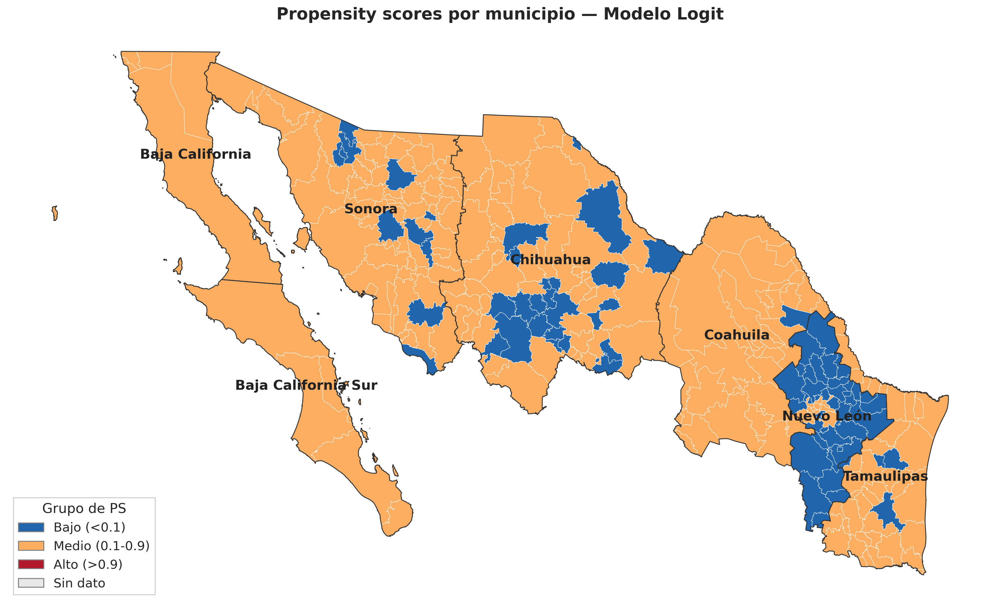

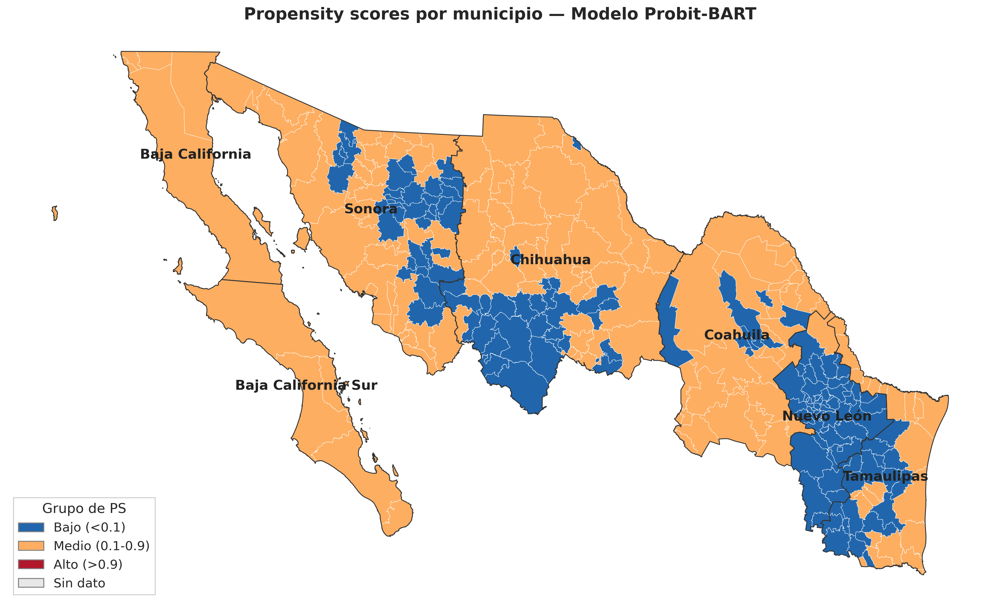

In [36]:
# ─────────────────────────────────────────────────────────────────────────────
# Mapa zoom por municipio (requiere shapefile INEGI local)
# ─────────────────────────────────────────────────────────────────────────────
import os
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

SHAPEFILE_PATH = './mg_sep2019_integrado/conjunto_de_datos/00mun.shp'
ESTADOS_FRONTERA = ["02", "03", "05", "08", "19", "26", "28"]

PS_PALETTE = {
    "Bajo (<0.1)":   "#2166ac",
    "Medio (0.1-0.9)": "#fdae61",
    "Alto (>0.9)":   "#b2182b",
    "Sin dato":      "#e8e8e8",
}

def plot_ps_zoom_map(gdf_border, ps_col, title, save_name=None):
    def classify(p):
        if pd.isnull(p):  return "Sin dato"
        elif p < 0.1:     return "Bajo (<0.1)"
        elif p > 0.9:     return "Alto (>0.9)"
        else:             return "Medio (0.1-0.9)"
    gdf_plot = gdf_border.copy()
    gdf_plot["ps_group"] = gdf_plot[ps_col].apply(classify)
    gdf_plot["color"]    = gdf_plot["ps_group"].map(PS_PALETTE)

    fig, ax = plt.subplots(figsize=(18, 11))
    gdf_plot.plot(color=gdf_plot["color"], edgecolor="white", linewidth=0.35, ax=ax)
    estados = gdf_plot.dissolve(by="CVE_ENT", as_index=False)
    estados.boundary.plot(ax=ax, color="#333333", linewidth=0.9)
    for _, row in estados.iterrows():
        cx, cy = row.geometry.centroid.coords[0]
        ax.annotate(NOMBRES_ESTADOS.get(row["CVE_ENT"], row["CVE_ENT"]),
                    (cx, cy), ha="center", va="center", fontsize=14,
                    fontweight="bold", color="#222222")
    handles = [Patch(facecolor=v, edgecolor="gray", label=k)
               for k, v in PS_PALETTE.items()]
    ax.legend(handles=handles, title="Grupo de PS", fontsize=13,
              title_fontsize=14, loc="lower left")
    ax.set_title(title, fontsize=17, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    if save_name:
        save_fig(save_name, fig)

if os.path.exists(SHAPEFILE_PATH):
    import geopandas as gpd
    gdf_mun = gpd.read_file(SHAPEFILE_PATH)
    gdf_mun["CVEGEO"]  = gdf_mun["CVEGEO"].astype(str).str.zfill(5)
    gdf_mun["CVE_ENT"] = gdf_mun["CVEGEO"].str[:2]
    gdf_border = gdf_mun[gdf_mun["CVE_ENT"].isin(ESTADOS_FRONTERA)].copy()
    gdf_border = gdf_border.to_crs(epsg=6372)

    ps_lookup = pd.DataFrame({
        "CVEGEO":    dat["LLAVE"].astype(str).str.zfill(5).values,
        "ps_logit":  ps_logit,
        "ps_probit": ps_probit,
    }).drop_duplicates(subset="CVEGEO")
    gdf_border = gdf_border.merge(ps_lookup, on="CVEGEO", how="left")
    print(f"Polígonos cruzados con el análisis: "
          f"{gdf_border['ps_logit'].notna().sum()} / {len(gdf_border)}")

    plot_ps_zoom_map(gdf_border, "ps_logit",
                     "Propensity scores por municipio — Modelo Logit",
                     save_name="14_mapa_ps_logit")
    plot_ps_zoom_map(gdf_border, "ps_probit",
                     "Propensity scores por municipio — Modelo Probit-BART",
                     save_name="15_mapa_ps_bart")
else:
    print(f"AVISO: no se encontró el shapefile en {SHAPEFILE_PATH}; "
          "se omite el mapa. Coloca el Marco Geoestadístico INEGI para generarlo.")


# Estimación doblemente robusta del ATE: AIPW

Conforme a la sección teórica de la tesis, **se estima AIPW** (Augmented IPW, doblemente robusto).

**Definiciones.** Con regresiones de *outcome* por grupo $m_z(x)=\mathbb{E}[Y\mid Z=z, X=x]$ y *propensity score* $e(x)$, los pseudo-outcomes son
$$\phi_1(O_i) = m_1(X_i) + \frac{Z_i}{e(X_i)}\bigl(Y_i - m_1(X_i)\bigr),\qquad
\phi_0(O_i) = m_0(X_i) + \frac{1-Z_i}{1-e(X_i)}\bigl(Y_i - m_0(X_i)\bigr),$$
y el estimador es $\widehat{\tau}_{\mathrm{AIPW}} = \frac{1}{n}\sum_i \bigl(\phi_1(O_i)-\phi_0(O_i)\bigr)$. Es **consistente si al menos uno** de los dos modelos (tratamiento u *outcome*) está bien especificado (Bang y Robins, 2005; Robins et al., 1994).

**Propagación de incertidumbre (plug-in Monte Carlo).** Siguiendo la subsección 3.1.4 del texto, $\widehat m_0,\widehat m_1$ se ajustan por OLS **una sola vez** (no dependen del PS), y para cada draw posterior $e^{(s)}$ se evalúa $\widehat\tau^{(s)}_{\mathrm{AIPW}}$, induciendo una distribución Monte Carlo sobre el ATE.


In [37]:
# ─────────────────────────────────────────────────────────────────────────────
# Regresiones de outcome por grupo (OLS, UNA sola vez) y extracción de draws
# ─────────────────────────────────────────────────────────────────────────────
def fit_outcome_models(X_out, t, y):
    """OLS separado por grupo: m1 con tratados, m0 con controles.
    Devuelve predicciones m1_hat, m0_hat evaluadas en TODA la muestra."""
    ols1 = sm.OLS(y[t == 1], X_out[t == 1]).fit()
    ols0 = sm.OLS(y[t == 0], X_out[t == 0]).fit()
    m1_hat = ols1.predict(X_out).values
    m0_hat = ols0.predict(X_out).values
    return m0_hat, m1_hat, ols0, ols1

def get_p_draws(idata):
    """Matriz (S, n) con TODOS los draws posteriores de e(X) — 4 cadenas
    apiladas (corrige el bug de la cadena 0 del notebook original)."""
    P = idata.posterior["p"].stack(s=("chain", "draw")).values.T
    return np.clip(P, 1e-6, 1 - 1e-6)

def aipw_ate_draws(P, m0_hat, m1_hat, t, y):
    """AIPW vectorizado: pseudo-outcomes phi1/phi0 (ecs. del texto) evaluados
    en cada draw posterior e^(s). Devuelve DataFrame (S, 3)."""
    Z = t.values[None, :]                 # (1, n)
    Y = y.values[None, :]
    M1 = m1_hat[None, :]
    M0 = m0_hat[None, :]
    phi1 = M1 + Z * (Y - M1) / P          # (S, n)
    phi0 = M0 + (1 - Z) * (Y - M0) / (1 - P)
    return pd.DataFrame({
        "ATE":     (phi1 - phi0).mean(axis=1),
        "E(Y(1))": phi1.mean(axis=1),
        "E(Y(0))": phi0.mean(axis=1),
    })

def plot_ate(ate_df, titulo, save_name=None):
    """Dos paneles: posterior inducida del ATE y de E(Y(1)), E(Y(0)).
    Devuelve Series resumen con media, HPDI 90% y P(ATE>0)."""
    tau = ate_df["ATE"].values
    lo, hi = az.hdi(tau, prob=0.90)
    media = tau.mean()
    p_pos = (tau > 0).mean()

    fig, axs = plt.subplots(1, 2, figsize=(15, 5.5))
    axs[0].hist(tau, bins=60, color="#4878d0", ec="black", alpha=0.8)
    axs[0].axvline(0, color="black", lw=1.5)
    axs[0].axvline(media, color="red", lw=2, label=f"E(ATE) = {media:.3f}")
    axs[0].axvspan(lo, hi, color="orange", alpha=0.25,
                   label=f"HPDI 90% = [{lo:.3f}, {hi:.3f}]")
    axs[0].set_title(f"Distribución inducida del ATE\n{titulo}",
                     fontsize=14, fontweight="bold")
    axs[0].set_xlabel("ATE"); axs[0].legend(fontsize=11)

    axs[1].hist(ate_df["E(Y(1))"], bins=60, alpha=0.6, color="blue",
                ec="black", label="E(Y(1))")
    axs[1].hist(ate_df["E(Y(0))"], bins=60, alpha=0.6, color="red",
                ec="black", label="E(Y(0))")
    axs[1].set_title("Medias potenciales", fontsize=14, fontweight="bold")
    axs[1].legend(fontsize=11)
    plt.tight_layout()
    if save_name:
        save_fig(save_name, fig)

    return pd.Series({
        "E(ATE)": media, "HPDI 5%": lo, "HPDI 95%": hi,
        "P(ATE>0)": p_pos, "S draws": len(tau)}, name=titulo)

m0_hat, m1_hat, ols0, ols1 = fit_outcome_models(X_out, t, y)
print("OLS m1 (tratados):  R2 =", round(ols1.rsquared, 3),
      "| n =", int(t.sum()))
print("OLS m0 (controles): R2 =", round(ols0.rsquared, 3),
      "| n =", int((1 - t).sum()))


OLS m1 (tratados):  R2 = 0.699 | n = 43
OLS m0 (controles): R2 = 0.395 | n = 238


Draws posteriores: (16000, 281) (S, n) — 4 cadenas completas


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\940975797.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/16_ate_logit_completa.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\940975797.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/17_ate_bart_completa.png  (+ pdf)


,E(ATE),HPDI 5%,HPDI 95%,P(ATE>0),S draws
AIPW + PS Logit (muestra completa),-0.4943,-0.8584,-0.0902,0.0390,16000.0
AIPW + PS Probit-BART (muestra completa),-0.7549,-1.1824,-0.3633,0.0068,16000.0


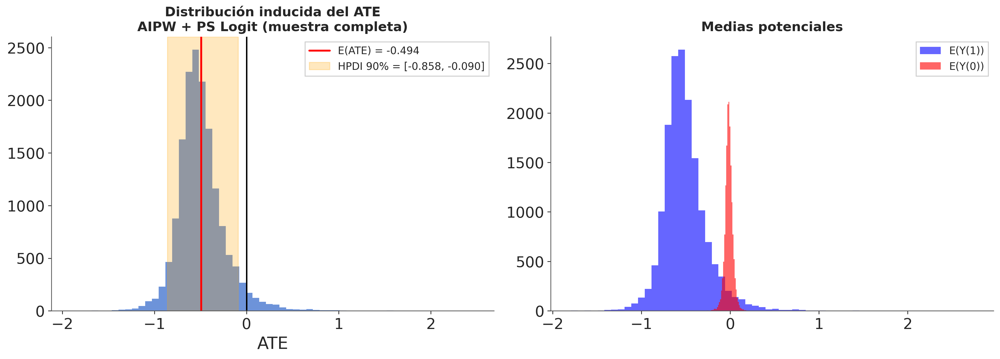

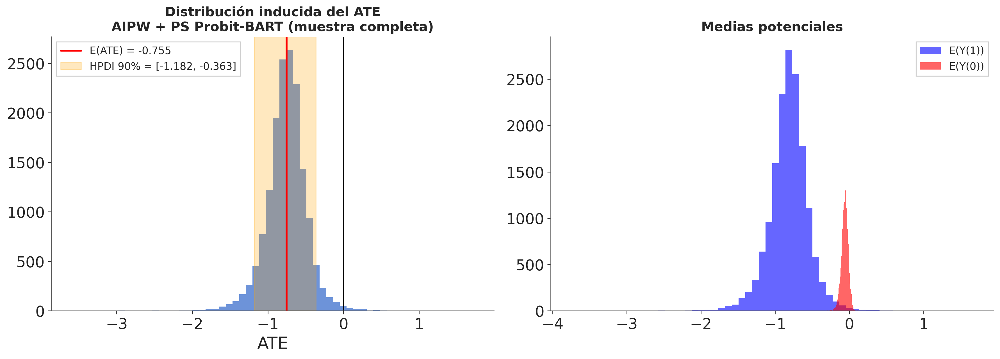

In [38]:
# ─────────────────────────────────────────────────────────────────────────────
# AIPW — muestra completa, PS Logit y PS Probit-BART (16,000 draws cada uno)
# ─────────────────────────────────────────────────────────────────────────────
P_logit  = get_p_draws(idata_logit)
P_probit = get_p_draws(idata_probit)
print("Draws posteriores:", P_logit.shape, "(S, n) — 4 cadenas completas")

ate_logit_full  = aipw_ate_draws(P_logit,  m0_hat, m1_hat, t, y)
ate_probit_full = aipw_ate_draws(P_probit, m0_hat, m1_hat, t, y)

res_logit_full  = plot_ate(ate_logit_full,  "AIPW + PS Logit (muestra completa)",
                           save_name="16_ate_logit_completa")
res_probit_full = plot_ate(ate_probit_full, "AIPW + PS Probit-BART (muestra completa)",
                           save_name="17_ate_bart_completa")

pd.DataFrame([res_logit_full, res_probit_full]).round(4)


## Resultado primario: AIPW en la muestra recortada

La muestra recortada ($0.1\le e\le 0.9$ bajo ambos modelos) es el **resultado primario**: dentro del soporte común los pesos $Z/e$ y $(1-Z)/(1-e)$ están acotados y el AIPW es estable.  Se reutilizan los draws posteriores ya obtenidos, restringidos por columnas a los municipios recortados (`P[:, trim_idx]`), lo que garantiza coherencia interna y reproducibilidad. Las regresiones OLS de *outcome* sí se **reajustan dentro de la muestra recortada**, pues $m_z$ debe estimarse sobre la población de interés.


OLS trimmed — m1: R2 = 0.671 | m0: R2 = 0.403
Draws restringidos: (16000, 133)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\940975797.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/18_ate_logit_recortada.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\940975797.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/19_ate_bart_recortada.png  (+ pdf)


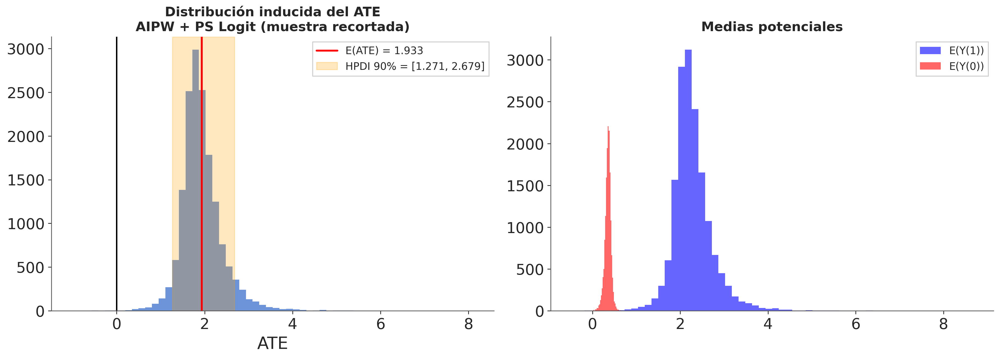

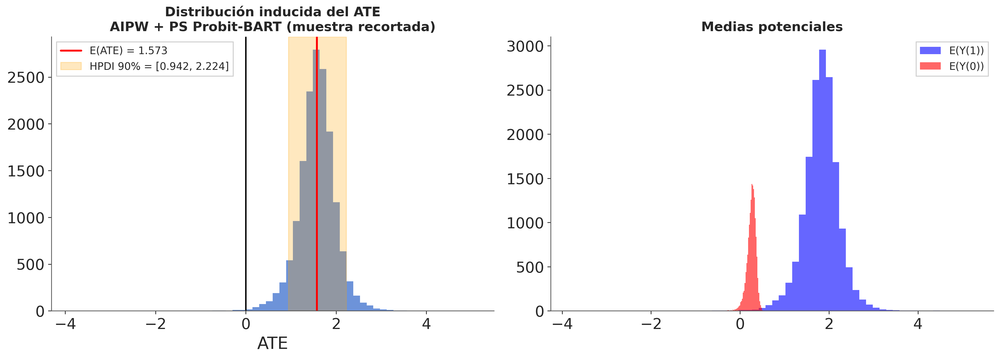

In [39]:
# ─────────────────────────────────────────────────────────────────────────────
# AIPW — muestra recortada (slicing directo de draws, refit de OLS)
# ─────────────────────────────────────────────────────────────────────────────
idx = trim_original_indices
t_tr = t.iloc[idx].reset_index(drop=True)
y_tr = y.iloc[idx].reset_index(drop=True)
X_out_tr = X_out.iloc[idx].reset_index(drop=True)

m0_tr, m1_tr, ols0_tr, ols1_tr = fit_outcome_models(X_out_tr, t_tr, y_tr)
print("OLS trimmed — m1: R2 =", round(ols1_tr.rsquared, 3),
      "| m0: R2 =", round(ols0_tr.rsquared, 3))

P_logit_tr  = P_logit[:, idx]
P_probit_tr = P_probit[:, idx]
print("Draws restringidos:", P_logit_tr.shape)

ate_logit_trim  = aipw_ate_draws(P_logit_tr,  m0_tr, m1_tr, t_tr, y_tr)
ate_probit_trim = aipw_ate_draws(P_probit_tr, m0_tr, m1_tr, t_tr, y_tr)

res_logit_trim  = plot_ate(ate_logit_trim,
                           "AIPW + PS Logit (muestra recortada)",
                           save_name="18_ate_logit_recortada")
res_probit_trim = plot_ate(ate_probit_trim,
                           "AIPW + PS Probit-BART (muestra recortada)",
                           save_name="19_ate_bart_recortada")


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1333319180.py:16: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/20_overlap_recortada.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1287238356.py:45: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/21_balance_smd_recortada.png  (+ pdf)


,Crudo,IPW Logit,IPW Probit-BART
Presencia de maquila,0.510,0.043,0.174
Chihuahua,-0.453,-0.228,-0.296
PIB Q5,0.423,-0.043,0.140
Informalidad inicial (%),-0.370,0.007,-0.165
log población,0.320,-0.061,0.016
Tamaulipas,0.320,0.202,0.183
PIB Q4,-0.284,-0.094,-0.187
Baja California,0.276,-0.040,0.098
log PIB per cápita,0.203,-0.133,0.062
PIB Q3,-0.190,0.015,-0.111


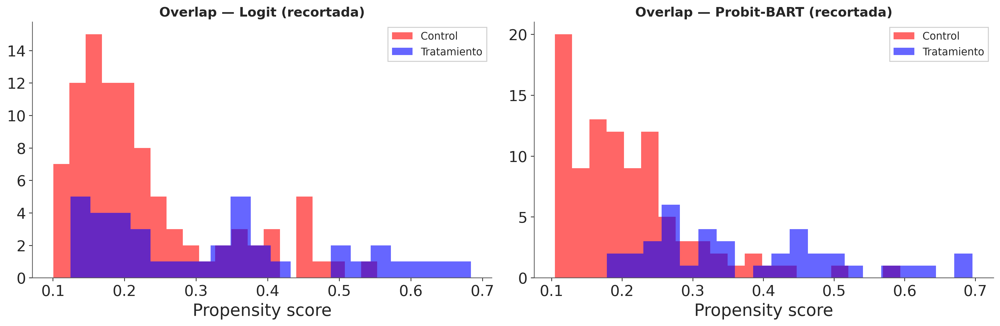

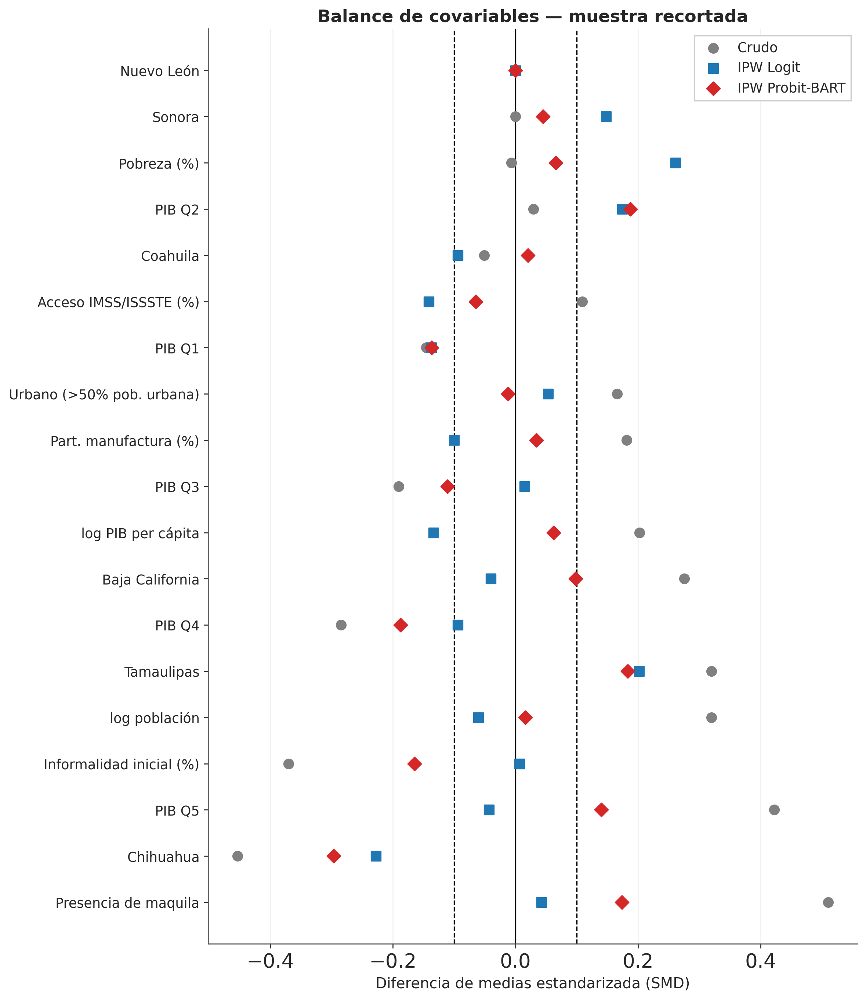

In [40]:
# ─────────────────────────────────────────────────────────────────────────────
# Overlap y balance en la muestra recortada
# ─────────────────────────────────────────────────────────────────────────────
ps_logit_tr  = ps_logit[idx]
ps_probit_tr = ps_probit[idx]

fig, axs = plt.subplots(1, 2, figsize=(15, 5))
for ax, ps, nombre in [(axs[0], ps_logit_tr, "Logit"),
                       (axs[1], ps_probit_tr, "Probit-BART")]:
    ax.hist(ps[t_tr == 0], bins=20, color="red",  alpha=0.6, ec="black",
            label="Control")
    ax.hist(ps[t_tr == 1], bins=20, color="blue", alpha=0.6, ec="black",
            label="Tratamiento")
    ax.set_title(f"Overlap — {nombre} (recortada)", fontsize=14)
    ax.set_xlabel("Propensity score"); ax.legend(fontsize=11)
plt.tight_layout()
save_fig("20_overlap_recortada", fig)

Xs_tr = Xs_all.iloc[idx].reset_index(drop=True)
tabla_smd_trim = love_plot(
    Xs_tr, t_tr,
    {"Logit": ps_logit_tr, "Probit-BART": ps_probit_tr},
    "Balance de covariables — muestra recortada",
    save_name="21_balance_smd_recortada")
tabla_smd_trim


### Descriptivo y estratos de la muestra recortada

Para comparación visual directa con la muestra completa, se replican el análisis descriptivo y los cinco criterios de estratificación sobre la muestra con soporte común. Las figuras se guardan con sufijo `_recortada`.


Muestra recortada: 133 municipios, 38 tratados
[guardada] FigurasPSAIPW/01_densidad_outcome_recortada.png  (+ pdf)


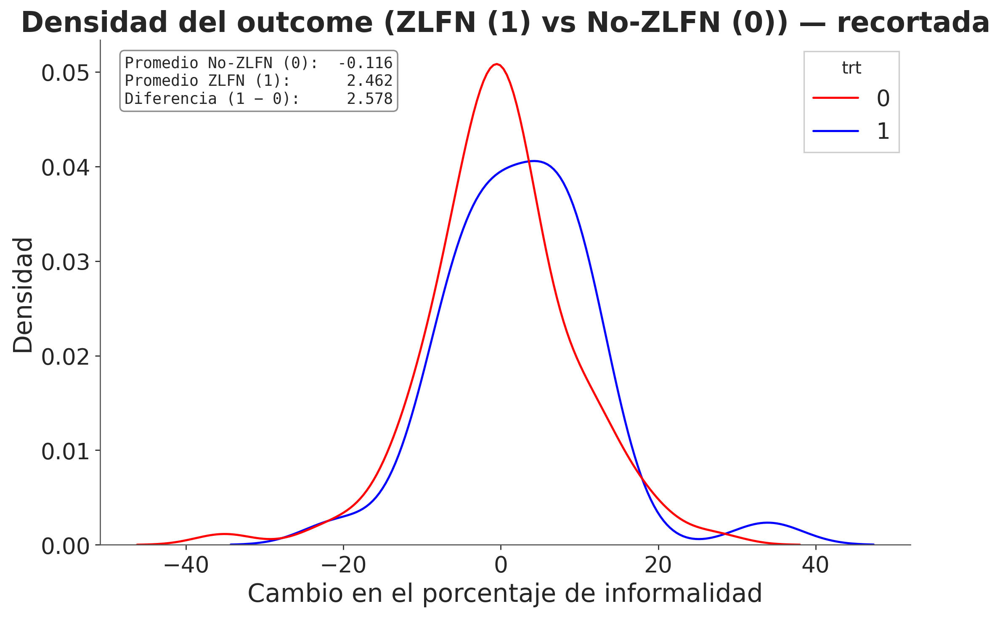

RawDiff (recortada): 2.5780095943827375


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\1387657694.py:24: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/02_panel_descriptivo_recortada.png  (+ pdf)
[guardada] FigurasPSAIPW/03_cuantiles_outcome_recortada.png  (+ pdf)


,outcome
trt,
0,-0.116215
1,2.461794


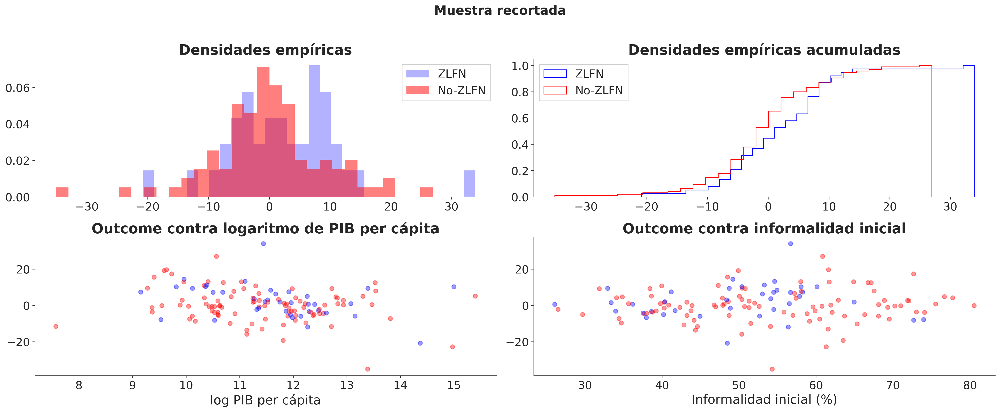

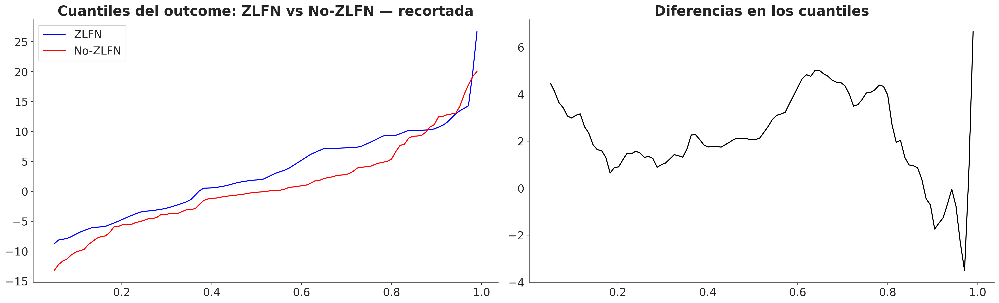

In [41]:
# ─────────────────────────────────────────────────────────────────────────────
# Descriptivo de la muestra recortada (mismas funciones, sufijo _recortada)
# ─────────────────────────────────────────────────────────────────────────────
data_trim = data.iloc[idx].reset_index(drop=True)
print(f"Muestra recortada: {len(data_trim)} municipios, "
      f"{int(data_trim['trt'].sum())} tratados")

raw_diff_trim = plot_densidad_outcome(data_trim, "recortada")
plot_panel_descriptivo(data_trim, "recortada")
plot_cuantiles(data_trim, "recortada")
raw_diff_trim


AdjRawDiff (recortada — entidad federativa): 2.8045


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/22_estratos_entidad_recortada.png  (+ pdf)


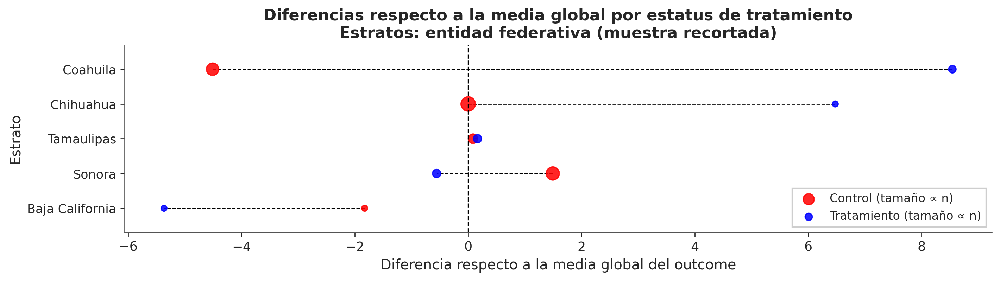

AdjRawDiff (recortada — quintil de PIB municipal): 5.1022


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/23_estratos_pib_recortada.png  (+ pdf)


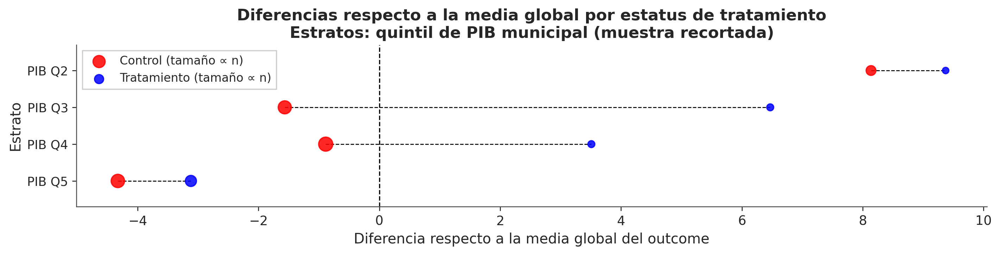

AdjRawDiff (recortada — entidad × quintil de PIB): 4.2438


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/24_estratos_entidad_x_pib_recortada.png  (+ pdf)


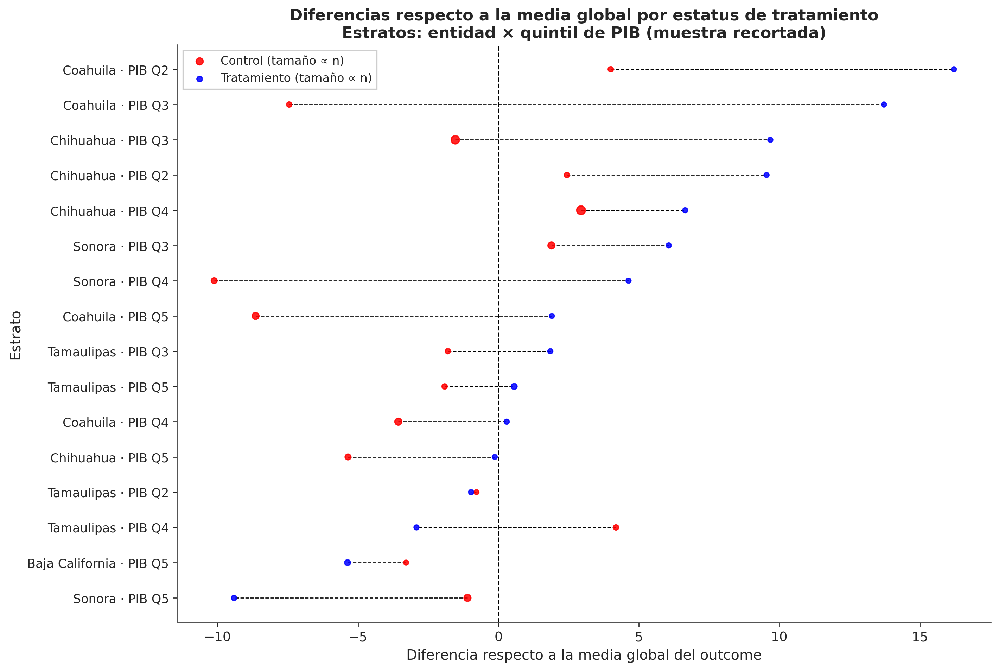

AdjRawDiff (recortada — Sonora × condición urbana × PIB Q5): 2.8495


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/25_estratos_sonora_recortada.png  (+ pdf)


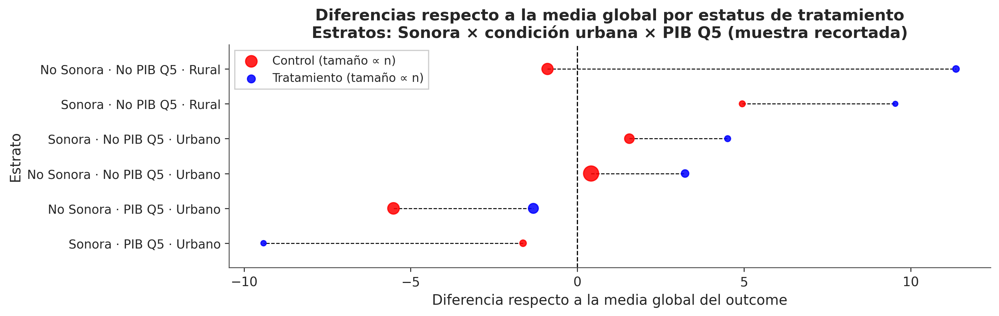

AdjRawDiff (recortada — Coahuila × condición urbana × PIB Q5): 7.7790


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\2390842846.py:81: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/26_estratos_coahuila_recortada.png  (+ pdf)


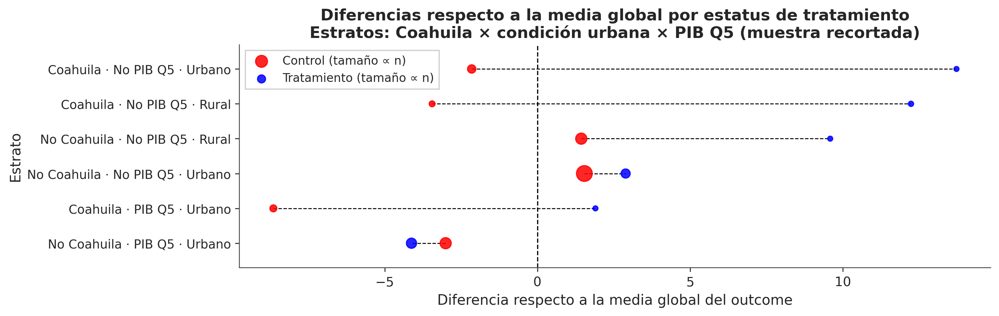

In [42]:
# ─────────────────────────────────────────────────────────────────────────────
# Estratos de la muestra recortada (los mismos cinco criterios)
# Nota: algunos estratos pueden quedar vacíos en un grupo tras el recorte y
# desaparecen del dumbbell (el merge control×tratamiento los excluye).
# ─────────────────────────────────────────────────────────────────────────────
criterios = [
    ("entidad federativa",                 list(STATE_LABELS),
     "22_estratos_entidad_recortada"),
    ("quintil de PIB municipal",           list(PIB_LABELS),
     "23_estratos_pib_recortada"),
    ("entidad × quintil de PIB",           list(STATE_LABELS) + list(PIB_LABELS),
     "24_estratos_entidad_x_pib_recortada"),
    ("Sonora × condición urbana × PIB Q5", ["state_26", "urban", "pib_class_5"],
     "25_estratos_sonora_recortada"),
    ("Coahuila × condición urbana × PIB Q5", ["state_5", "urban", "pib_class_5"],
     "26_estratos_coahuila_recortada"),
]
for titulo, cols, fname in criterios:
    st = make_strata_table(data_trim, cols)
    adj_raw_diff(st, f"(recortada — {titulo})")
    make_strata_plot(st, cols, f"Estratos: {titulo} (muestra recortada)",
                     save_name=fname)
    plt.show()


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3807632284.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/27_balance_quintilPS_informal_recortada.png  (+ pdf)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3807632284.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/28_balance_quintilPS_imss_recortada.png  (+ pdf)


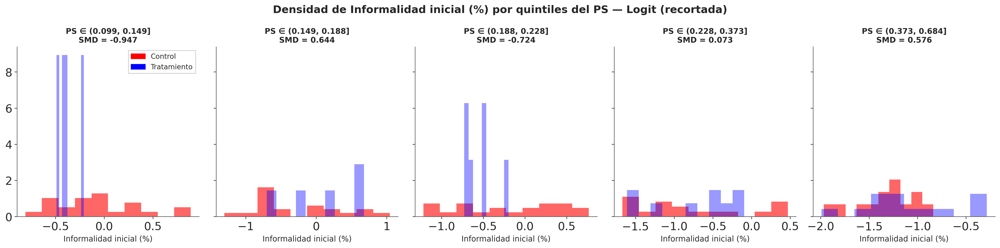

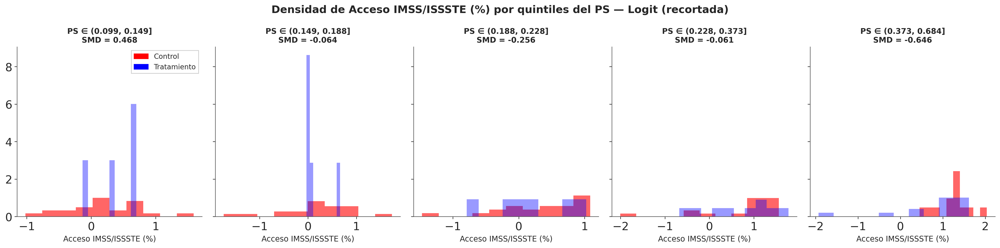

In [43]:
# ─────────────────────────────────────────────────────────────────────────────
# Balance por quintiles del PS en la muestra recortada
# ─────────────────────────────────────────────────────────────────────────────
plot_balance(Xs_tr, "informal",   t_tr, ps_logit_tr, "Logit (recortada)",
             save_name="27_balance_quintilPS_informal_recortada")
plot_balance(Xs_tr, "imssissste", t_tr, ps_logit_tr, "Logit (recortada)",
             save_name="28_balance_quintilPS_imss_recortada")


In [44]:
# ─────────────────────────────────────────────────────────────────────────────
# Tabla final: ATE por modelo de PS × muestra
# ─────────────────────────────────────────────────────────────────────────────
tabla_final = pd.DataFrame([
    res_logit_full, res_probit_full, res_logit_trim, res_probit_trim
]).round(4)
tabla_final.index.name = "Especificación"
tabla_final.to_csv(os.path.join(FIG_DIR, "tabla_ate_final.csv"))
print(f"[guardada] {FIG_DIR}/tabla_ate_final.csv")
tabla_final


[guardada] FigurasPSAIPW/tabla_ate_final.csv


,E(ATE),HPDI 5%,HPDI 95%,P(ATE>0),S draws
Especificación,,,,,
AIPW + PS Logit (muestra completa),-0.4943,-0.8584,-0.0902,0.0390,16000.0
AIPW + PS Probit-BART (muestra completa),-0.7549,-1.1824,-0.3633,0.0068,16000.0
AIPW + PS Logit (muestra recortada),1.9325,1.2706,2.6788,0.9992,16000.0
AIPW + PS Probit-BART (muestra recortada),1.5727,0.9419,2.2240,0.9974,16000.0


**Lectura de la tabla.** El parámetro reportado en la tesis es el ATE de la **muestra recortada**; las estimaciones de la muestra completa se presentan como análisis de sensibilidad. La concordancia entre la especificación paramétrica (Logit) y la no paramétrica (Probit-BART) es en sí misma una verificación de robustez frente al supuesto funcional del mecanismo de asignación. Las regresiones de *outcome* son lineales; si tanto éstas como el PS estuvieran mal especificados, el estimador podría ser sesgado (límite de la doble robustez).


## Cuantificación honesta de la incertidumbre del ATE: error estándar por EIF (sándwich) y *bootstrap* bayesiano

La distribución inducida de las secciones anteriores propaga **solo** la incertidumbre posterior de $e(X)$ a través de un AIPW *plug-in* con $\widehat m_0,\widehat m_1$ fijos y datos fijos. La incertidumbre total del ATE tiene tres componentes:

1. **Dispersión posterior de $e$** — la única que se propaga arriba.
2. **Incertidumbre de los coeficientes OLS** $\widehat m_z$ — de segundo orden aquí, pues el *outcome* es lineal y de baja dimensión.
3. **Variabilidad muestral del propio promedio AIPW** alrededor de $\tau$: la varianza de la función de influencia eficiente $\tfrac1n\mathrm{Var}(\psi_i)$ con $\psi_i=\phi_{1i}-\phi_{0i}-\tau$. Es la **cota de eficiencia semiparamétrica** y el término **dominante** cuando $n$ es pequeño.

El componente (3) **no** lo aporta variar $(m,e)$ en la fórmula puntual —el promedio sobre los $X_i$ observados se trata como fijo—. Lo aporta el ***bootstrap* bayesiano** (Rubin, 1981): una posterior $\mathrm{Dirichlet}(1,\dots,1)$ sobre los pesos empíricos, $\widehat\tau^{(s)}=\sum_i w_i^{(s)}\bigl(\phi_{1i}-\phi_{0i}\bigr)$. Su varianza posterior iguala a la del estimador **sándwich/EIF** a primer orden. Emparejando un vector de pesos Dirichlet con cada *draw* posterior $e^{(s)}$ se obtiene una posterior **coherente** del ATE que captura los componentes (1)+(3) y **conserva la doble robustez** (se mantiene $\widehat m$ como *plug-in* OLS, sin reintroducir sensibilidad al modelo de *outcome*).

Se reporta, para cada especificación: el intervalo *e-only* anterior (componente 1), el **IC 95% por EIF/sándwich** (componente 3, frecuentista), y el **HPDI 90% del *bootstrap* bayesiano** (componentes 1+3, bayesiano, **resultado inferencial primario**). Como validación cruzada, el SD del *bootstrap* bayesiano evaluado en $\widehat e$ fijo debe coincidir con el SE sándwich: ambos estiman el componente muestral (3).


In [45]:
# ─────────────────────────────────────────────────────────────────────────────
# Inferencia del ATE: EIF (sándwich) + bootstrap bayesiano sobre los phi_i
# ─────────────────────────────────────────────────────────────────────────────
rng_bb = np.random.default_rng(SEED)   # reproducibilidad del bootstrap bayesiano


def aipw_contrast_matrix(P, m0_hat, m1_hat, t, y):
    """(S, n): contraste AIPW por unidad  D[s, i] = phi1_i - phi0_i  en el draw e^(s).
    Idéntica a la usada por aipw_ate_draws; el ATE 'e-only' es D.mean(axis=1)."""
    Z = t.values[None, :]; Y = y.values[None, :]
    M1 = m1_hat[None, :];  M0 = m0_hat[None, :]
    phi1 = M1 + Z * (Y - M1) / P
    phi0 = M0 + (1 - Z) * (Y - M0) / (1 - P)
    return phi1 - phi0


def aipw_eif_se(ps_hat, m0_hat, m1_hat, t, y):
    """SE por función de influencia eficiente (sándwich), evaluado en la media
    posterior del PS.  psi_i = phi1_i - phi0_i ;  Var(tau) = Var(psi)/n.
    Espejo frecuentista del bootstrap bayesiano (componente muestral 3)."""
    e = np.clip(ps_hat, 1e-6, 1 - 1e-6)
    Z = t.values; Y = y.values
    psi = (m1_hat + Z * (Y - m1_hat) / e) - (m0_hat + (1 - Z) * (Y - m0_hat) / (1 - e))
    n = len(psi); tau = psi.mean(); se = psi.std(ddof=1) / np.sqrt(n)
    return pd.Series({"tau_EIF": tau, "SE_EIF": se,
                      "IC95_lo": tau - 1.96 * se, "IC95_hi": tau + 1.96 * se})


def aipw_bb_draws(P, m0_hat, m1_hat, t, y, rng, fixed_e=None):
    """Bootstrap bayesiano (Rubin, 1981): un vector de pesos Dirichlet(1,...,1)
    por draw posterior, aplicado a los contrastes AIPW por unidad.
      - fixed_e=None : usa e^(s) por draw  -> captura componentes (1)+(3).
      - fixed_e=ps   : usa e fijo en todos los draws -> aísla (3) [validación vs EIF].
    Devuelve tau_bb de tamaño (S,)."""
    if fixed_e is not None:
        ef = np.clip(fixed_e, 1e-6, 1 - 1e-6)
        D = aipw_contrast_matrix(np.repeat(ef[None, :], P.shape[0], axis=0),
                                 m0_hat, m1_hat, t, y)
    else:
        D = aipw_contrast_matrix(P, m0_hat, m1_hat, t, y)
    S, n = D.shape
    W = rng.dirichlet(np.ones(n), size=S)          # (S, n), filas suman 1
    return np.einsum("sn,sn->s", W, D)


def bb_summary(tau_bb, nombre):
    """Resumen de la posterior bootstrap-bayesiana del ATE."""
    lo90, hi90 = az.hdi(tau_bb, prob=0.90)
    lo95, hi95 = az.hdi(tau_bb, prob=0.95)
    return pd.Series({"E(ATE)": tau_bb.mean(), "SD_BB": tau_bb.std(ddof=1),
                      "HPDI90_lo": lo90, "HPDI90_hi": hi90,
                      "HPDI95_lo": lo95, "HPDI95_hi": hi95,
                      "P(ATE>0)": (tau_bb > 0).mean()}, name=nombre)


In [46]:
# ─────────────────────────────────────────────────────────────────────────────
# Descomposición de la incertidumbre y validación  BB@e-fijo ≈ SE sándwich
# ─────────────────────────────────────────────────────────────────────────────
ESPECS = [
    ("AIPW + Logit (completa)",        P_logit,     m0_hat, m1_hat, t,    y,    ps_logit),
    ("AIPW + Probit-BART (completa)",  P_probit,    m0_hat, m1_hat, t,    y,    ps_probit),
    ("AIPW + Logit (recortada)",       P_logit_tr,  m0_tr,  m1_tr,  t_tr, y_tr, ps_logit_tr),
    ("AIPW + Probit-BART (recortada)", P_probit_tr, m0_tr,  m1_tr,  t_tr, y_tr, ps_probit_tr),
]

filas_desc, bb_post = [], {}
for nombre, P, m0_, m1_, tt, yy, ps_ in ESPECS:
    sd_eonly = aipw_contrast_matrix(P, m0_, m1_, tt, yy).mean(axis=1).std(ddof=1)
    eif      = aipw_eif_se(ps_, m0_, m1_, tt, yy)
    bb_fix   = aipw_bb_draws(P, m0_, m1_, tt, yy, rng_bb, fixed_e=ps_)
    bb_full  = aipw_bb_draws(P, m0_, m1_, tt, yy, rng_bb)
    bb_post[nombre] = bb_full
    filas_desc.append(pd.Series({
        "SD (1) e-only":        sd_eonly,
        "SE (3) EIF/sándwich":  eif["SE_EIF"],
        "SD (3) BB@e-fijo":     bb_fix.std(ddof=1),
        "ratio BB@e-fijo/EIF":  bb_fix.std(ddof=1) / eif["SE_EIF"],
        "SD (1+3) BB completo": bb_full.std(ddof=1),
    }, name=nombre))

tabla_desc = pd.DataFrame(filas_desc).round(4)
tabla_desc.to_csv(os.path.join(FIG_DIR, "tabla_incertidumbre_descomposicion.csv"))
print(f"[guardada] {FIG_DIR}/tabla_incertidumbre_descomposicion.csv")
print("Validación: 'ratio BB@e-fijo/EIF' ≈ 1 confirma que el bootstrap bayesiano")
print("recupera la varianza de la cota de eficiencia (componente muestral 3).")
print("Nótese que 'SD (1) e-only' << 'SE (3) EIF': la incertidumbre dominante es la muestral.\n")
tabla_desc


[guardada] FigurasPSAIPW/tabla_incertidumbre_descomposicion.csv
Validación: 'ratio BB@e-fijo/EIF' ≈ 1 confirma que el bootstrap bayesiano
recupera la varianza de la cota de eficiencia (componente muestral 3).
Nótese que 'SD (1) e-only' << 'SE (3) EIF': la incertidumbre dominante es la muestral.



,SD (1) e-only,SE (3) EIF/sándwich,SD (3) BB@e-fijo,ratio BB@e-fijo/EIF,SD (1+3) BB completo
AIPW + Logit (completa),0.2562,0.8264,0.8192,0.9913,1.0608
AIPW + Probit-BART (completa),0.2684,0.7610,0.7630,1.0027,0.9219
AIPW + Logit (recortada),0.4794,1.2731,1.2746,1.0012,1.7417
AIPW + Probit-BART (recortada),0.4152,1.1573,1.1505,0.9942,1.4211


[guardada] FigurasPSAIPW/tabla_ate_intervalos.csv


,E(ATE),e-only90 lo,e-only90 hi,EIF IC95 lo,EIF IC95 hi,BB HPDI90 lo,BB HPDI90 hi,P>0 e-only,P>0 EIF,P>0 BB
AIPW + Logit (completa),-0.4819,-0.8584,-0.0902,-2.1603,1.0791,-2.1246,1.2274,0.0390,0.2565,0.2992
AIPW + Probit-BART (completa),-0.7431,-1.1824,-0.3633,-2.2129,0.7700,-2.2310,0.7345,0.0068,0.1715,0.2004
AIPW + Logit (recortada),1.9158,1.2706,2.6788,-0.6476,4.3430,-0.9261,4.4683,0.9992,0.9267,0.8877
AIPW + Probit-BART (recortada),1.5764,0.9419,2.2240,-0.6799,3.8567,-0.7209,3.8193,0.9974,0.9150,0.8782


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3121918899.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/30_intervalos_ate_inferencia.png  (+ pdf)


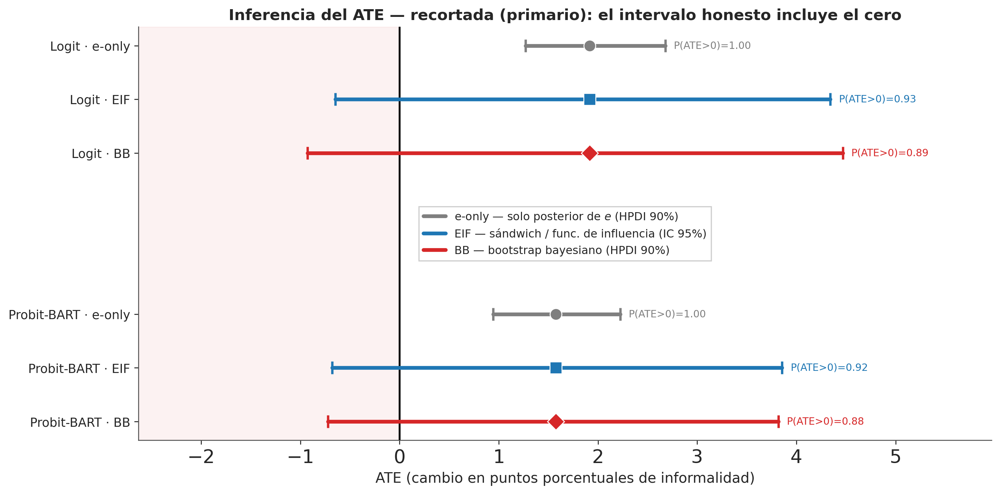

In [47]:
# ─────────────────────────────────────────────────────────────────────────────
# Intervalos del ATE: e-only (previo) vs EIF/sándwich vs bootstrap bayesiano
# (resultado inferencial primario) + figura comparativa (muestra recortada)
# ─────────────────────────────────────────────────────────────────────────────
res_eonly = {
    "AIPW + Logit (completa)":        res_logit_full,
    "AIPW + Probit-BART (completa)":  res_probit_full,
    "AIPW + Logit (recortada)":       res_logit_trim,
    "AIPW + Probit-BART (recortada)": res_probit_trim,
}

filas_int = []
for nombre, P, m0_, m1_, tt, yy, ps_ in ESPECS:
    eif  = aipw_eif_se(ps_, m0_, m1_, tt, yy)
    bb   = bb_summary(bb_post[nombre], nombre)
    prev = res_eonly[nombre]
    filas_int.append(pd.Series({
        "E(ATE)":       bb["E(ATE)"],
        "e-only90 lo":  float(prev["HPDI 5%"]),
        "e-only90 hi":  float(prev["HPDI 95%"]),
        "EIF IC95 lo":  eif["IC95_lo"],
        "EIF IC95 hi":  eif["IC95_hi"],
        "BB HPDI90 lo": bb["HPDI90_lo"],
        "BB HPDI90 hi": bb["HPDI90_hi"],
        # P(ATE>0): e-only y BB desde sus draws; EIF por aprox. normal Phi(tau/SE)
        "P>0 e-only":   float(prev["P(ATE>0)"]),
        "P>0 EIF":      float(norm.cdf(eif["tau_EIF"] / eif["SE_EIF"])),
        "P>0 BB":       float(bb["P(ATE>0)"]),
    }, name=nombre))

tabla_intervalos = pd.DataFrame(filas_int).round(4)
tabla_intervalos.to_csv(os.path.join(FIG_DIR, "tabla_ate_intervalos.csv"))
print(f"[guardada] {FIG_DIR}/tabla_ate_intervalos.csv")
display(tabla_intervalos)

# ── Figura comparativa de intervalos (muestra recortada = primaria) ──────────
specs_plot = ["AIPW + Logit (recortada)", "AIPW + Probit-BART (recortada)"]
metodos = [
    ("e-only", "e-only90 lo", "e-only90 hi", "P>0 e-only", "#7f7f7f", "o", "solo posterior de $e$ (HPDI 90%)"),
    ("EIF",    "EIF IC95 lo", "EIF IC95 hi", "P>0 EIF",    "#1f77b4", "s", "sándwich / func. de influencia (IC 95%)"),
    ("BB",     "BB HPDI90 lo", "BB HPDI90 hi", "P>0 BB",   "#d62728", "D", "bootstrap bayesiano (HPDI 90%)"),
]
xmin = min(tabla_intervalos[c].min() for c in ["e-only90 lo", "EIF IC95 lo", "BB HPDI90 lo"]) - 0.4
xmax = max(tabla_intervalos[c].max() for c in ["e-only90 hi", "EIF IC95 hi", "BB HPDI90 hi"]) + 1.5

fig, ax = plt.subplots(figsize=(12, 6))
ax.axvspan(xmin, 0, color="#d62728", alpha=0.06, zorder=0)   # zona ATE < 0
yticks, ylabels = [], []
for bi, spec in enumerate(specs_plot):
    spec_short = "Logit" if "Logit" in spec else "Probit-BART"
    base = bi * (len(metodos) + 2)          # +2: deja un hueco central amplio para la leyenda
    for mi, (etq, clo, chi, pcol, col, mk, desc) in enumerate(metodos):
        yj = base + mi
        lo = tabla_intervalos.loc[spec, clo]; hi = tabla_intervalos.loc[spec, chi]
        pt = tabla_intervalos.loc[spec, "E(ATE)"]
        ax.plot([lo, hi], [yj, yj], color=col, lw=3.2, solid_capstyle="round",
                label=f"{etq} — {desc}" if bi == 0 else None, zorder=2)
        ax.plot([lo, hi], [yj, yj], "|", color=col, ms=11, mew=2, zorder=2)
        ax.plot(pt, yj, mk, color=col, ms=10, mec="white", mew=0.8, zorder=3)
        yticks.append(yj); ylabels.append(f"{spec_short} · {etq}")
        # P(ATE>0) en LOS SEIS intervalos, al extremo derecho de cada uno
        ppos = tabla_intervalos.loc[spec, pcol]
        ax.annotate(f"P(ATE>0)={ppos:.2f}", (hi, yj), xytext=(7, 0),
                    textcoords="offset points", va="center", fontsize=8.5, color=col)
ax.axvline(0, color="black", lw=1.6, zorder=1)
ax.set_xlim(xmin, xmax)
ax.set_yticks(yticks); ax.set_yticklabels(ylabels, fontsize=10.5); ax.invert_yaxis()
ax.set_xlabel("ATE (cambio en puntos porcentuales de informalidad)", fontsize=12)
ax.set_title("Inferencia del ATE — recortada (primario): el intervalo honesto incluye el cero",
             fontsize=13, fontweight="bold")
ax.legend(fontsize=9.5, loc="center", framealpha=0.95)   # leyenda en el hueco central
plt.tight_layout()
save_fig("30_intervalos_ate_inferencia", fig)


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\3486200367.py:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/31_descomposicion_incertidumbre.png  (+ pdf)


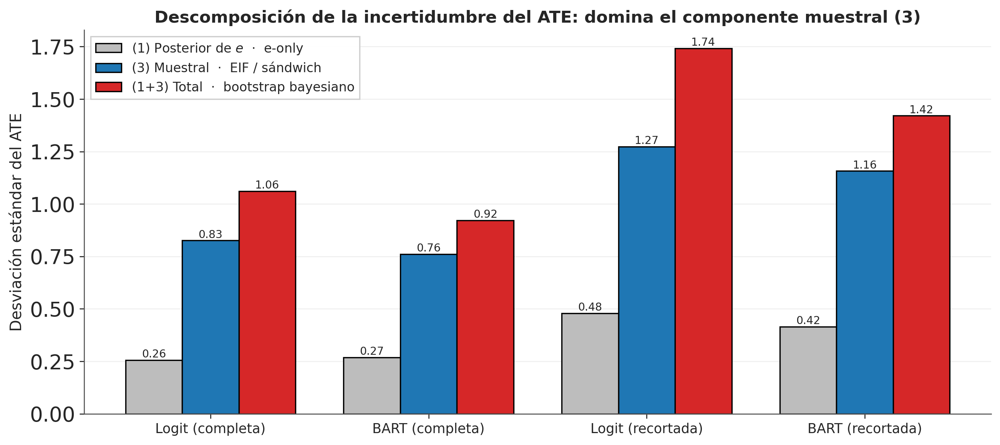

In [48]:
# ─────────────────────────────────────────────────────────────────────────────
# Figura: descomposición de la incertidumbre del ATE por componente
#   (1) posterior de e  |  (3) muestral (EIF)  |  (1+3) total (bootstrap bayes.)
# ─────────────────────────────────────────────────────────────────────────────
comp = tabla_desc[["SD (1) e-only", "SE (3) EIF/sándwich", "SD (1+3) BB completo"]]
labels_sp = [s.replace("AIPW + ", "").replace("Probit-BART", "BART") for s in comp.index]
x = np.arange(len(comp)); w = 0.26

fig, ax = plt.subplots(figsize=(11, 5))
b1 = ax.bar(x - w, comp["SD (1) e-only"],       w, color="#bdbdbd", ec="black",
            label="(1) Posterior de $e$  ·  e-only")
b3 = ax.bar(x,     comp["SE (3) EIF/sándwich"], w, color="#1f77b4", ec="black",
            label="(3) Muestral  ·  EIF / sándwich")
bf = ax.bar(x + w, comp["SD (1+3) BB completo"], w, color="#d62728", ec="black",
            label="(1+3) Total  ·  bootstrap bayesiano")
for bars in (b1, b3, bf):
    for r in bars:
        ax.annotate(f"{r.get_height():.2f}",
                    (r.get_x() + r.get_width() / 2, r.get_height()),
                    xytext=(0, 2), textcoords="offset points", ha="center", fontsize=8.5)
ax.set_xticks(x); ax.set_xticklabels(labels_sp, fontsize=10.5)
ax.set_ylabel("Desviación estándar del ATE", fontsize=12)
ax.set_title("Descomposición de la incertidumbre del ATE: domina el componente muestral (3)",
             fontsize=13, fontweight="bold")
ax.legend(fontsize=10, loc="upper left", framealpha=0.95)
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
save_fig("31_descomposicion_incertidumbre", fig)


**Lectura.** El intervalo *e-only* es sistemáticamente el más angosto porque omite el componente muestral dominante (3). El **IC 95% por EIF/sándwich** y el **HPDI 90% del *bootstrap* bayesiano** son de magnitud comparable —su coincidencia valida ambos— y constituyen el enunciado inferencial honesto: más anchos que el *e-only*, reflejando la variabilidad muestral del AIPW con $n$ pequeño. El *bootstrap* bayesiano es el **resultado primario** por ser una posterior coherente con el resto del capítulo, doblemente robusta (no reintroduce el modelo de *outcome*) y por respetar la asimetría finita de la distribución del ATE; el SE sándwich se reporta como contraste frecuentista en forma cerrada. Si se sospecharan choques al nivel de entidad federativa en el *outcome*, la independencia a nivel municipio que suponen ambos métodos debería revisarse —régimen de pocos clústeres—, aunque con seis entidades el *bootstrap* a nivel municipio es la opción pragmática.


## Análisis de sensibilidad a confusión no medida: E-value (muestra recortada)

El supuesto de no confusión condicional es inverificable. Como diagnóstico de robustez se reporta el **E-value** (VanderWeele y Ding, 2017): la mínima fuerza de asociación —en escala de razón de riesgos— que un confusor no medido tendría que tener **simultáneamente** con el tratamiento y con el outcome, condicional a las covariables medidas, para explicar por completo el efecto estimado. Un E-value de 1.7, por ejemplo, significa que un confusor omitido tendría que casi duplicar tanto la probabilidad de pertenecer a la ZLFN como el outcome para anular la asociación; confusores más débiles podrían atenuarla pero no eliminarla.

Para un outcome continuo, el efecto se convierte primero a diferencia estandarizada $d = \widehat{\tau}/s_Y$ y luego a razón de riesgos aproximada $RR \approx \exp(0.91\,d)$ (Hasselblad y Hedges, 1995; VanderWeele y Ding, 2017), con
$$\text{E-value} = RR + \sqrt{RR\,(RR-1)}.$$

Acorde con el enfoque del resto del notebook, el E-value se calcula **sobre cada draw posterior** del ATE, induciendo una distribución Monte Carlo del E-value; se reportan además los dos resúmenes convencionales: el E-value del estimado puntual y el del **límite del HPDI 90% más cercano al nulo** (el escenario conservador). Si dicho límite cruza el cero, su E-value es 1 por definición: un confusor de cualquier magnitud sería compatible con un efecto nulo en ese extremo del intervalo.

SD del outcome (muestra recortada): 9.244


C:\Users\Leobardo\AppData\Local\Temp\ipykernel_20148\644806323.py:55: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


[guardada] FigurasPSAIPW/29_evalue_recortada.png  (+ pdf)
[guardada] FigurasPSAIPW/tabla_evalue_recortada.csv


,E(ATE),d de Cohen,E-value (punto),Límite HPDI 90% más cercano a 0,E-value (límite HPDI),E[E-value] posterior,P(E-value > 1.5)
AIPW + PS Logit (recortada),1.933,0.209,1.713,1.271,1.522,1.713,0.970
AIPW + PS Probit-BART (recortada),1.573,0.170,1.610,0.942,1.424,1.609,0.856


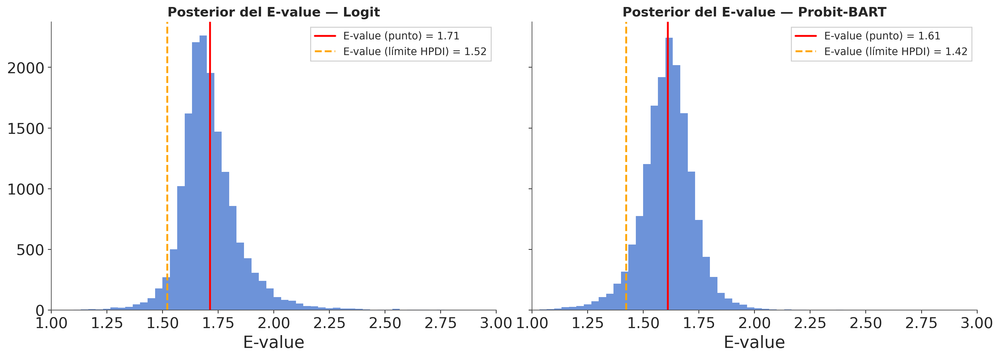

In [49]:
# ─────────────────────────────────────────────────────────────────────────────
# E-value sobre la distribución posterior del ATE (muestra recortada)
# Conversión: d = tau/s_Y  ->  RR ~= exp(0.91 d)  ->  EV = RR + sqrt(RR(RR-1))
# ─────────────────────────────────────────────────────────────────────────────
def evalue_from_rr(rr):
    """E-value de una razón de riesgos; simetriza direcciones (RR<1 -> 1/RR)."""
    rr = np.where(rr < 1, 1.0 / rr, rr)
    return rr + np.sqrt(rr * (rr - 1.0))

sd_y_tr = float(y_tr.std(ddof=1))
print(f"SD del outcome (muestra recortada): {sd_y_tr:.3f}")

def evalue_posterior(ate_df, nombre):
    tau = ate_df["ATE"].values
    ev_draws = evalue_from_rr(np.exp(0.91 * tau / sd_y_tr))

    media  = tau.mean()
    lo, hi = az.hdi(tau, prob=0.90)
    lim    = lo if media > 0 else hi          # límite más cercano al nulo

    ev_pt  = float(evalue_from_rr(np.exp(0.91 * np.array([media / sd_y_tr])))[0])
    # Si el HPDI cruza el cero, el E-value del límite es 1 por definición
    ev_lim = 1.0 if (lo < 0 < hi) else \
             float(evalue_from_rr(np.exp(0.91 * np.array([lim / sd_y_tr])))[0])

    resumen = pd.Series({
        "E(ATE)":                          media,
        "d de Cohen":                      media / sd_y_tr,
        "E-value (punto)":                 ev_pt,
        "Límite HPDI 90% más cercano a 0": lim,
        "E-value (límite HPDI)":           ev_lim,
        "E[E-value] posterior":            ev_draws.mean(),
        "P(E-value > 1.5)":                float((ev_draws > 1.5).mean()),
    }, name=nombre)
    return ev_draws, resumen

ev_logit,  res_ev_logit  = evalue_posterior(ate_logit_trim,
                                            "AIPW + PS Logit (recortada)")
ev_probit, res_ev_probit = evalue_posterior(ate_probit_trim,
                                            "AIPW + PS Probit-BART (recortada)")

fig, axs = plt.subplots(1, 2, figsize=(15, 5.5), sharey=True)
for ax, ev, res, nombre in [(axs[0], ev_logit,  res_ev_logit,  "Logit"),
                            (axs[1], ev_probit, res_ev_probit, "Probit-BART")]:
    ax.hist(ev, bins=60, range=(1.0, 3.0), color="#4878d0", ec="black", alpha=0.8)
    ax.axvline(res["E-value (punto)"], color="red", lw=2,
               label=f"E-value (punto) = {res['E-value (punto)']:.2f}")
    ax.axvline(res["E-value (límite HPDI)"], color="orange", lw=2, ls="--",
               label=f"E-value (límite HPDI) = {res['E-value (límite HPDI)']:.2f}")
    ax.set_title(f"Posterior del E-value — {nombre}",
                 fontsize=14, fontweight="bold")
    ax.set_xlabel("E-value")
    ax.set_xlim(1.0, 3.0)
    ax.legend(fontsize=11)
plt.tight_layout()
save_fig("29_evalue_recortada", fig)

tabla_evalue = pd.DataFrame([res_ev_logit, res_ev_probit]).round(3)
tabla_evalue.to_csv(os.path.join(FIG_DIR, "tabla_evalue_recortada.csv"))
print(f"[guardada] {FIG_DIR}/tabla_evalue_recortada.csv")
tabla_evalue

In [50]:
# ─────────────────────────────────────────────────────────────────────────────
# Inventario de figuras exportadas en alta definición
# ─────────────────────────────────────────────────────────────────────────────
import glob
pngs = sorted(glob.glob(os.path.join(FIG_DIR, "*.png")))
print(f"{len(pngs)} figuras PNG (300 dpi) en {FIG_DIR}/ "
      f"(+ versiones PDF vectoriales en {FIG_DIR}/pdf/):")
print()
for p in pngs:
    print("  ", os.path.basename(p))


53 figuras PNG (300 dpi) en FigurasPSAIPW/ (+ versiones PDF vectoriales en FigurasPSAIPW/pdf/):

   01_densidad_outcome_completa.png
   01_densidad_outcome_recortada.png
   02_panel_descriptivo_completa.png
   02_panel_descriptivo_recortada.png
   03_cuantiles_outcome_completa.png
   03_cuantiles_outcome_recortada.png
   04_estratos_entidad_completa.png
   05_estratos_pib_completa.png
   06_estratos_entidad_x_pib_completa.png
   07_estratos_sonora_completa.png
   08_estratos_coahuila_completa.png
   09_forest_ps_municipios.png
   10_overlap_pesos_completa.png
   11_balance_smd_completa.png
   12_balance_quintilPS_informal_completa.png
   13_balance_quintilPS_imss_completa.png
   14_mapa_ps_logit.png
   15_mapa_ps_bart.png
   16_ate_logit_completa.png
   17_ate_bart_completa.png
   18_ate_logit_recortada.png
   19_ate_bart_recortada.png
   20_overlap_recortada.png
   21_balance_smd_recortada.png
   22_estratos_entidad_recortada.png
   23_estratos_pib_recortada.png
   24_estratos_entidad

## Referencias

- Bang, H. y Robins, J. M. (2005). Doubly robust estimation in missing data and causal inference models. *Biometrics*, 61(4), 962–973.
- Chipman, H. A., George, E. I. y McCulloch, R. E. (2010). BART: Bayesian additive regression trees. *Annals of Applied Statistics*, 4(1), 266–298.
- Facure, M. (2023). *Causal Inference in Python*. O'Reilly Media.
- Gelman, A. y Hill, J. (2007). *Data Analysis Using Regression and Multilevel/Hierarchical Models*. Cambridge University Press.
- Gelman, A., Vehtari, A., Simpson, D., et al. (2020). Bayesian workflow. *arXiv:2011.01808*.
- Hahn, P. R., Murray, J. S. y Carvalho, C. M. (2020). Bayesian regression tree models for causal inference. *Bayesian Analysis*, 15(3), 965–1056.
- Hasselblad, V. y Hedges, L. V. (1995). Meta-analysis of screening and diagnostic tests. *Psychological Bulletin*, 117(1), 167–178.
- Robins, J. M., Rotnitzky, A. y Zhao, L. P. (1994). Estimation of regression coefficients when some regressors are not always observed. *JASA*, 89(427), 846–866.
- Rosenbaum, P. R. y Rubin, D. B. (1983). The central role of the propensity score in observational studies for causal effects. *Biometrika*, 70(1), 41–55.
- Stephens, A., et al. (2022). Causal inference under mis-specification: adjustment based on the propensity score. *Bayesian Analysis*.
- VanderWeele, T. J. y Ding, P. (2017). Sensitivity analysis in observational research: introducing the E-value. *Annals of Internal Medicine*, 167(4), 268–274
- Vehtari, A., Gelman, A. y Gabry, J. (2017). Practical Bayesian model evaluation using leave-one-out cross-validation and WAIC. *Statistics and Computing*, 27, 1413–1432.


In [51]:
# ─────────────────────────────────────────────────────────────────────────────
# Versiones del entorno (para reportar en la tesis)
# ─────────────────────────────────────────────────────────────────────────────
import sys
from importlib.metadata import version

print(f"Python    : {sys.version.split()[0]}")
for paquete in ["pymc", "pymc-bart", "arviz", "numba", "numpy", "pandas",
                "statsmodels", "matplotlib"]:
    try:
        print(f"{paquete:<11}: {version(paquete)}")
    except Exception:
        print(f"{paquete:<11}: no instalado")


Python    : 3.12.13
pymc       : 6.0.1
pymc-bart  : 0.12.0
arviz      : 1.1.0
numba      : 0.65.1
numpy      : 2.4.6
pandas     : 3.0.3
statsmodels: 0.14.6
matplotlib : 3.10.0
